<h2>2<sup>η</sup> ΕΡΓΑΣΤΗΡΙΑΚΗ ΑΣΚΗΣΗ</h2>
<h3>Ανάλυση Κοινωνικής Δομής σε Τεχνητές και Πραγματικές Σύνθετες Τοπολογίες Δικτύων</h3>
<p style=text-align:justify>Στην παρούσα άσκηση θα αναλυθούν τεχνητές και πραγματικές τοπολογίες σύνθετων δικτύων με βάση τις μετρικές που χρησιμοποιήθηκαν στην προηγούμενη άσκηση και κάποιες τεχνικές που έχουν ως στόχο την εύρεση κοινωνικής δομής. Συγκεκριμένα, θα χρησιμοποιηθούν και θα συγκριθούν διάφοροι αλγόριθμοι εντοπισμού κοινοτήτων σε γράφους δικτύων που προκύπτουν από πραγματικά δεδομένα καθώς και στους συνθετικούς γράφους της πρώτης εργαστηριακής άσκησης.</p>

In [201]:
%matplotlib inline

import matplotlib
import networkx as nx
import random
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
import time
from sklearn.cluster import SpectralClustering
from tqdm import tqdm

<h3>Α. Μελέτη πραγματικών τοπολογιών</h3>
<p style=text-align:justify>Στο παρόν ερώτημα θα μελετήσετε και θα αποκτήσετε αίσθηση της τοπολογικής δομής πραγματικών δικτύων. Πιο συγκεκριμένα, για τις τοπολογίες που φαίνονται στον <b>πίνακα 1</b>, να βρεθούν και να δειχθούν:</p>
<ol>
    <li>Η κατανομή του βαθμού κόμβου και ο μέσος βαθμός κάθε τοπολογίας.</li>
    <li>Η κατανομή του συντελεστή ομαδοποίησης κόμβου και ο μέσος συντελεστής ομαδοποίησης κάθε τοπολογίας.</li>
    <li>Η κατανομή της κεντρικότητας εγγύτητας και η μέση κεντρικότητα εγγύτητας κάθε τοπολογίας.</li>
</ol>
<p style=text-align:justify>Να συγκριθούν τα αποτελέσματα σε σχέση με αυτά των συνθετικών τοπολογιών. Να χαρακτηρίσετε τον τύπο κάθε μίας από τις πραγματικές τοπολογίες με βάση τους τύπους δικτύων που εξετάστηκαν στην πρώτη εργαστηριακή άσκηση.</p>

<table style=width:100%>
    <caption>Πίνακας <b>1</b>: Πραγματικές τοπολογίες</a></caption>
<tr>
    <th style=text-align:left>Τοπολογία</th>
    <th style=text-align:left>Αρχείο</th>
    <th style=text-align:left>Περιγραφή</th>
</tr>
<tr>
    <td style=text-align:left>American College Football</td>
    <td style=text-align:left><a style=text-decoration:none href='https://helios.ntua.gr/pluginfile.php/43944/mod_assign/intro/football.gml'>football.gml</a></td>
    <td style=text-align:left><p style=text-align:justify> The file <b>football.gml</b> contains the network of American football games between Division IA colleges during regular season Fall 2000, as compiled by M. Girvan and M. Newman. The nodes have values that indicate to which conferences they belong.</p>
    </td>
</tr>  
<tr>
    <td style=text-align:left>Game of Thrones - season 5</td>
    <td style=text-align:left><a style=text-decoration:none href='https://networkofthrones.wordpress.com/the-series/season-5/'>GoT</a></td>
    <td style=text-align:left><p style=text-align:justify> The season 5 <b>GoT</b> network represents the interactions between the characters of Game of Thrones in season 5. The season 5 network has 118 nodes (characters) and 394 weighted edges, corresponding to 5,139 interactions. Data can be found here: <a style=text-decoration:none href='https://raw.githubusercontent.com/mathbeveridge/gameofthrones/master/data/got-s5-edges.csv'>GoT_data</a></p>
</tr>
<tr>
    <td style=text-align:left>email-Eu-core</td>
    <td style=text-align:left><a style=text-decoration:none href='https://snap.stanford.edu/data/email-Eu-core.html'>email-eu-core</a></td>
    <td style=text-align:left><p style=text-align:justify> The network <b>email-Eu-core</b> was generated using email data from a large European research institution. There is an edge (u, v) in the network if person u sent person v at least one email. The e-mails only represent communication between institution members (the core) and the dataset does not contain incoming messages from or outgoing messages to the rest of the world. The dataset also contains "ground-truth" community memberships of the nodes. Each individual belongs to exactly one of 42 departments at the research institute. </p>
</tr>
    
</table>

<h4>Παραγωγή συνθετικών τοπολογιών</h4>
<p>Προσοχή! Τα δίκτυα που θα παράξετε θα πρέπει να είναι συνδεδεμένα.</p>

In [203]:
n=80
d=4
M=300
R=0.25
p=0.3
k=4 # watts_strogatz_graph parameter k for SW network
seedno=5
random.seed(seedno)

# REG
REG = nx.watts_strogatz_graph(n, k, 0.0); REG.graph['name'] = 'REG'
print(nx.is_connected(REG))

# RGER
RGER = nx.gnm_random_graph(n, M); RGER.graph['name'] = 'RGER'
print(nx.is_connected(RGER))

# RGG
RGG = nx.random_geometric_graph(n, R, 2); RGG.graph['name'] = 'RGG'
print(nx.is_connected(RGG))

# SF
SF = nx.barabasi_albert_graph(n, d); SF.graph['name'] = 'SF'
print(nx.is_connected(SF))

# SW
SW = nx.watts_strogatz_graph(n, k, p); SW.graph['name'] = 'SW'
print(nx.is_connected(SW))

True
True
True
True
True


<h4>Εισαγωγή και οπτικοποίηση πραγματικών τοπολογιών.</h4>

In [205]:
#football network
football=nx.read_gml(r"football.gml")
football.graph['name'] = 'FOOTBALL'

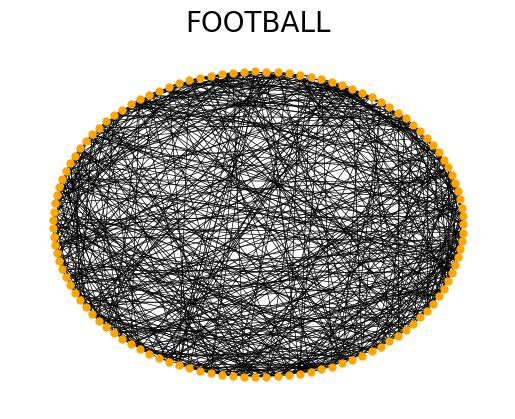

In [207]:
plt.figure
plt.title("FOOTBALL", fontsize=20)
nx.draw_circular(football, node_size=25, node_color="orange", with_labels=False, width=0.5)

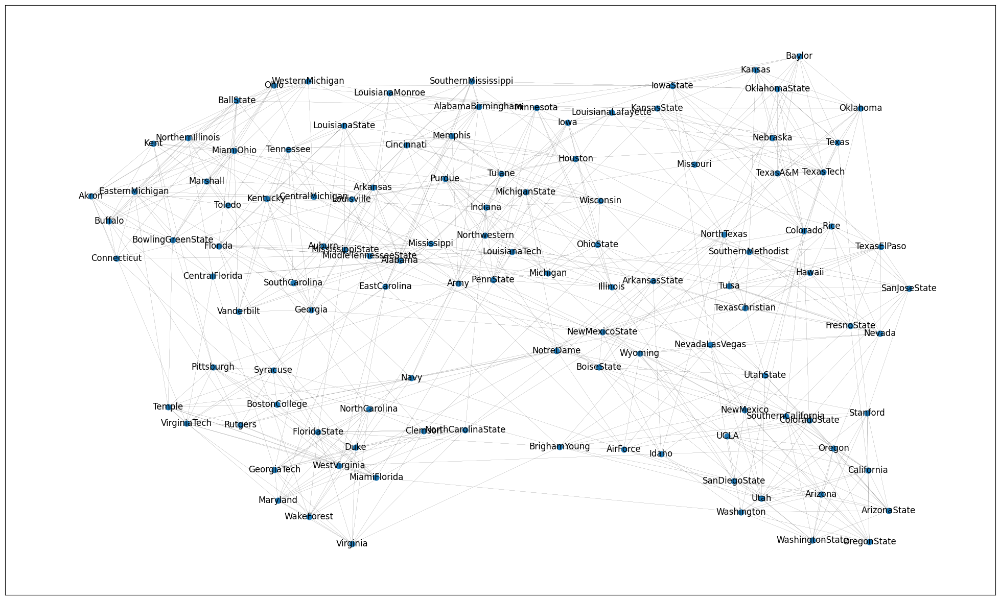

In [209]:
plt.figure(figsize = (25,15))
nx.draw_networkx(football, node_size = 60, with_labels = True, width = .1)
plt.show()

In [211]:
#Game of thrones network
import csv
got=nx.Graph()
with open('got_s5.csv') as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=',')
    line_count = 0
    next(csv_reader)
    for row in csv_reader:
        got.add_edge(row[0],row[1])
        line_count += 1

got.graph['name'] = 'GOT'

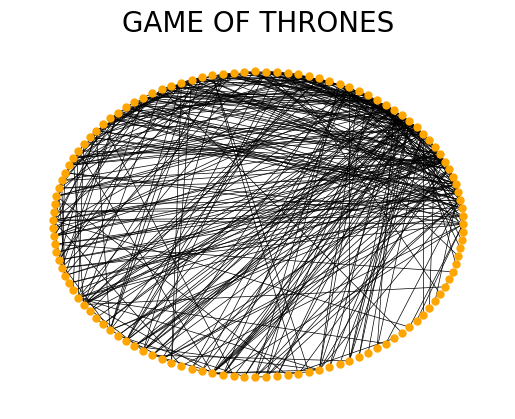

In [213]:
plt.figure
plt.title("GAME OF THRONES", fontsize=20)
nx.draw_circular(got, node_size=25, node_color="orange", with_labels=False, width=0.5)

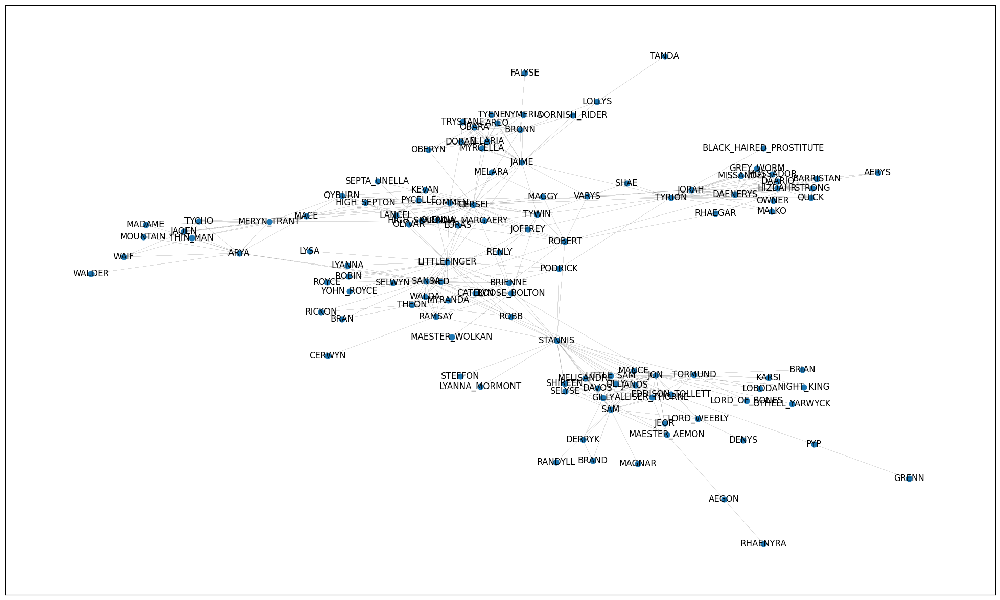

In [215]:
plt.figure(figsize = (25,15))
nx.draw_networkx(got, node_size = 60, with_labels = True, width = .1)
plt.show()

#### Προσοχή! Θα μελετήσετε τη μεγαλύτερη συνδεδεμένη συνιστώσα του δικτύου email-Eu-core, αφού πρώτα αφαιρέσετε τα self-loops. Μπορείτε να κάνετε χρήση των συναρτήσεων connected_components, subgraph, remove_edges_from του networkx.

In [319]:
#email-Eu-core network
eu=nx.read_edgelist("email-Eu-core.txt",create_using=nx.Graph())
eu.graph['name'] = 'EU'
eu_copy = eu.copy()

Previous edges:  16687
Current edges:  16064


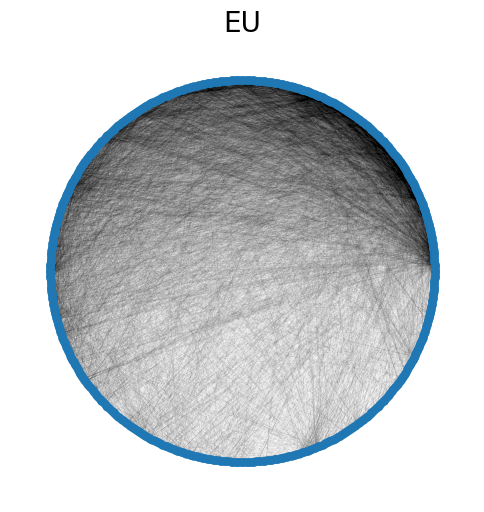

In [219]:
eu_largest_cc = max(nx.connected_components(eu), key=len)
eu = eu.subgraph(eu_largest_cc).copy()
print("Previous edges: ", len(eu.edges()))
eu.remove_edges_from(nx.selfloop_edges(eu))
print("Current edges: ", len(eu.edges()))

plt.figure(figsize=(6, 6))
plt.title("EU", fontsize=20)
nx.draw_circular(eu, node_size=25, with_labels=False, width=0.01)

<h4>Μελέτη βαθμού κόμβου για πραγματικές και συνθετικές τοπολογίες.</h4>

In [221]:
Synthetic_Graphs = [REG, RGER, RGG, SF, SW]
Real_Graphs = [football, got, eu]

In [223]:
def node_degree(G):
  plt.title(G.graph['name'], fontsize=30)
  degrees = [x[1] for x in G.degree()] 
  plt.hist(degrees, color="orange", range=(0,30))
  print("Mean = %s" % str(round(np.mean(degrees), 2)))

Mean = 10.66


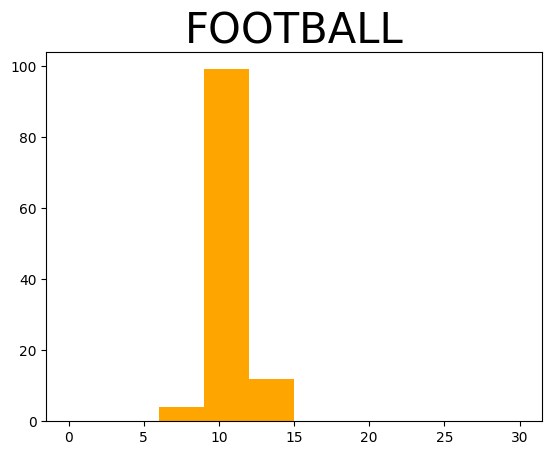

In [225]:
node_degree(football)

Mean = 6.66


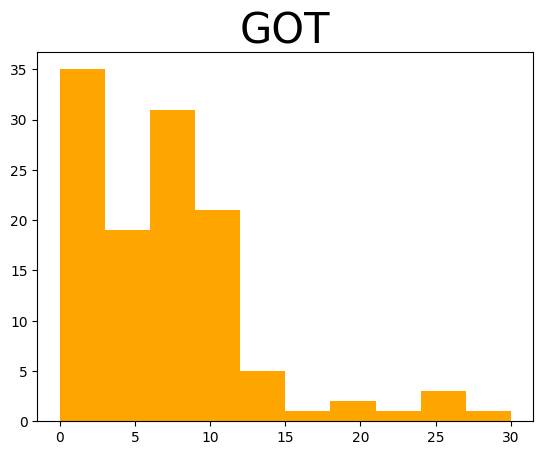

In [227]:
node_degree(got)

Mean = 32.58


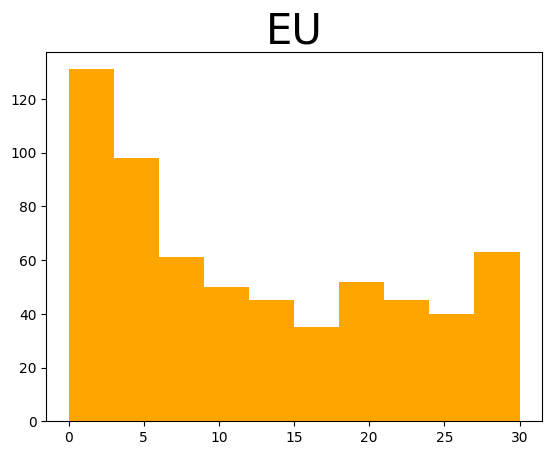

In [229]:
node_degree(eu)

Mean = 4.0


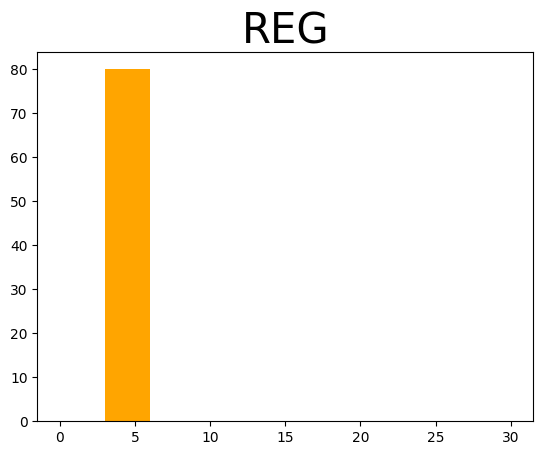

In [231]:
node_degree(REG)

Mean = 7.5


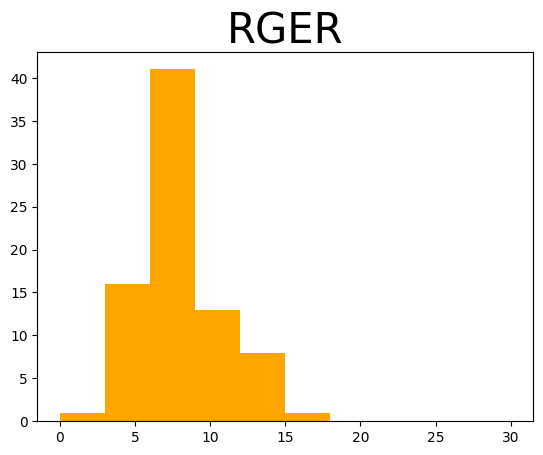

In [233]:
node_degree(RGER)

Mean = 14.0


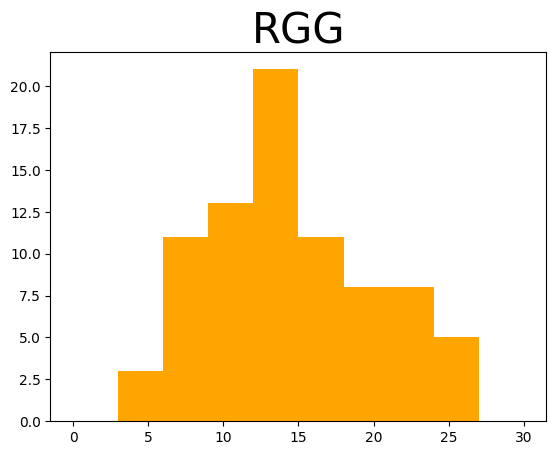

In [235]:
node_degree(RGG)

Mean = 7.6


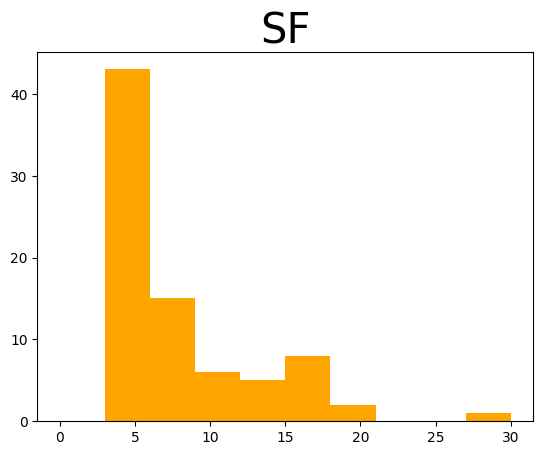

In [237]:
node_degree(SF)

Mean = 4.0


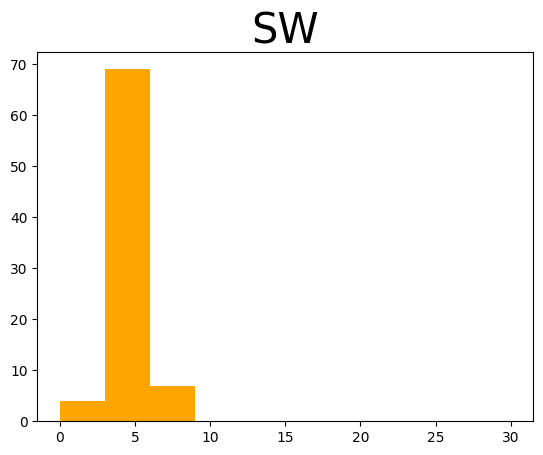

In [239]:
node_degree(SW)

<h4>Μελέτη συντελεστή ομαδοποίησης για πραγματικές και συνθετικές τοπολογίες</h4>

In [241]:
def cc(G):
  plt.title(G.graph['name'], fontsize=30)
  coefficients_dict = nx.clustering(G) 
  coefficients = [coefficients_dict.get(x) for x in coefficients_dict] 
  plt.hist(coefficients, color="orange", range=(0,1))
  print("Mean = %s" % str(round(np.mean(coefficients), 2)))

Mean = 0.4


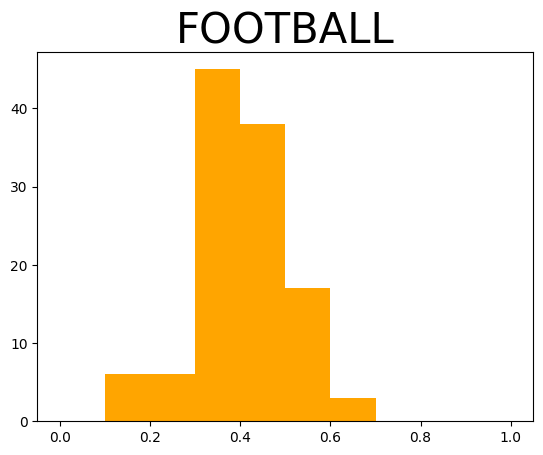

In [243]:
cc(football)

Mean = 0.57


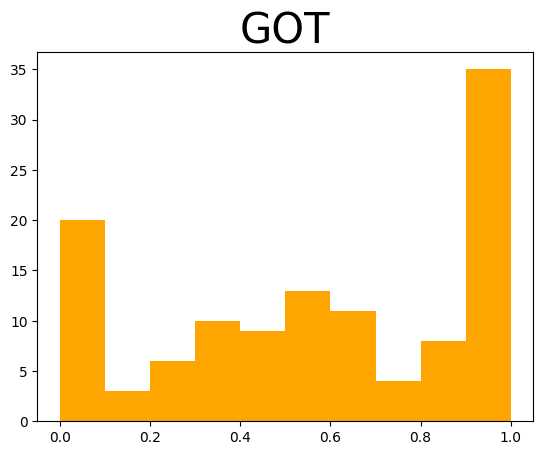

In [245]:
cc(got)

Mean = 0.41


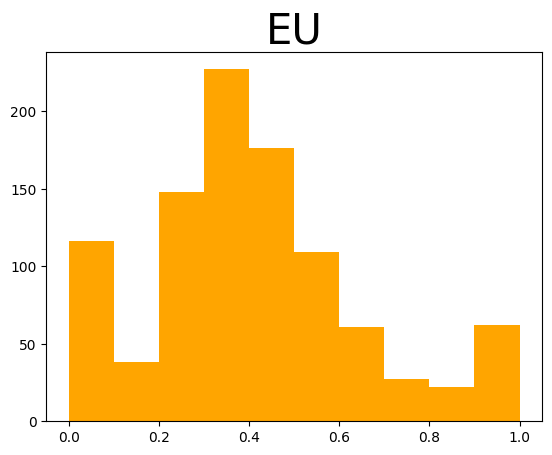

In [247]:
cc(eu)

Mean = 0.5


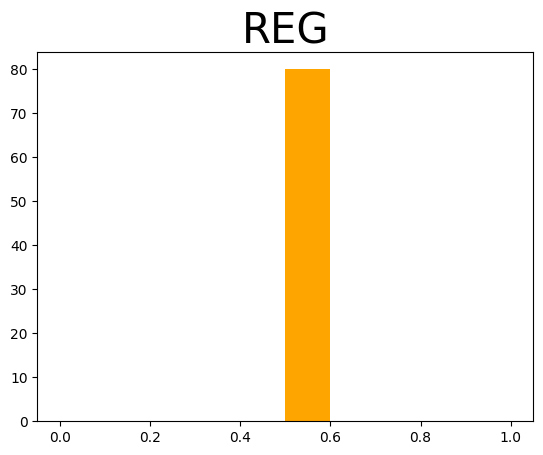

In [249]:
cc(REG)

Mean = 0.11


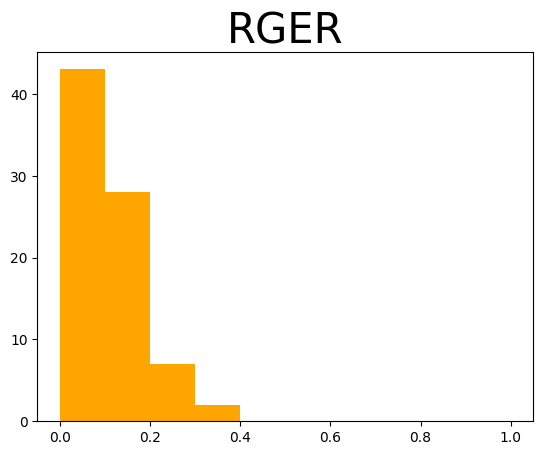

In [251]:
cc(RGER)

Mean = 0.69


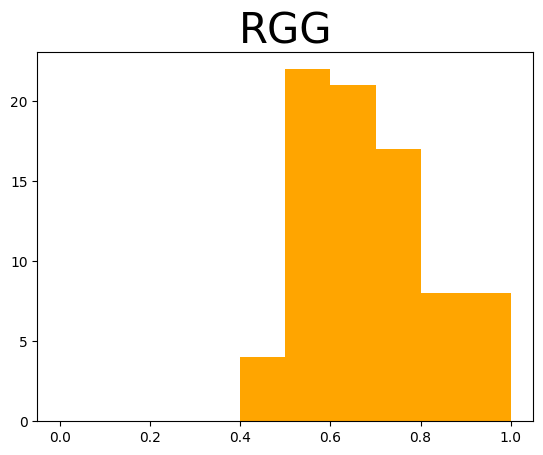

In [253]:
cc(RGG)

Mean = 0.15


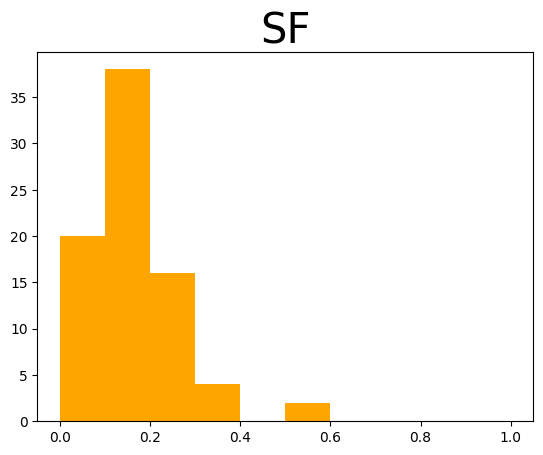

In [255]:
cc(SF)

Mean = 0.19


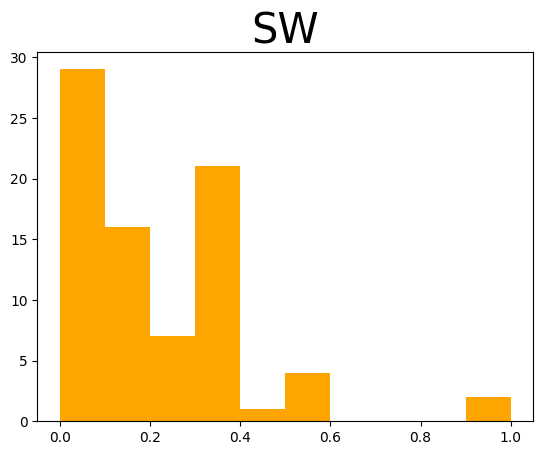

In [257]:
cc(SW)

<h4>Μελέτη κεντρικότητας εγγύτητας για πραγματικές και συνθετικές τοπολογίες </h4>

In [259]:
def find_closeness(G):
  plt.title(G.graph['name'], fontsize=30) 
  centralities_dict = nx.closeness_centrality(G) 
  centralities = [centralities_dict.get(x) for x in centralities_dict]
  plt.hist(centralities, color="orange", range=(0,0.6))
  print("Mean = %s" % str(round(np.mean(centralities), 2)))  

Mean = 0.4


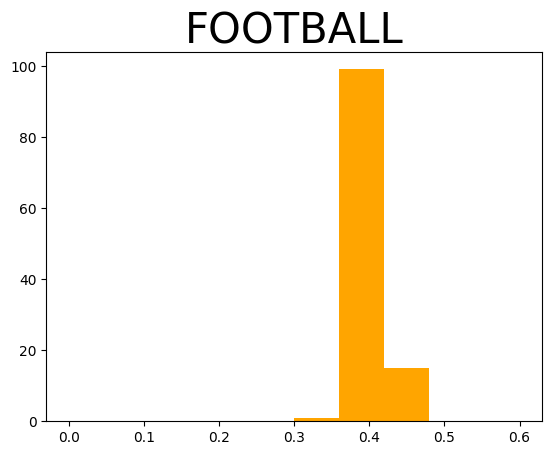

In [261]:
find_closeness(football)

Mean = 0.32


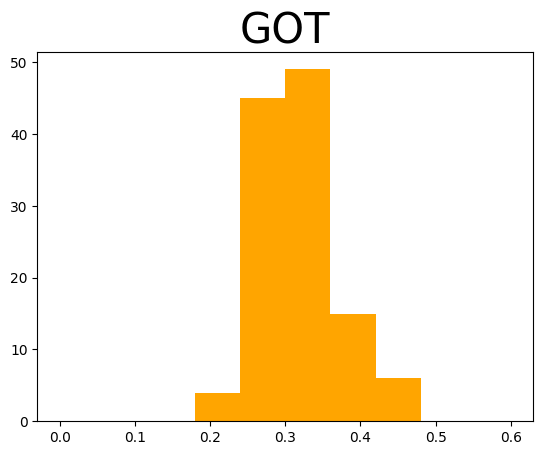

In [263]:
find_closeness(got)

Mean = 0.39


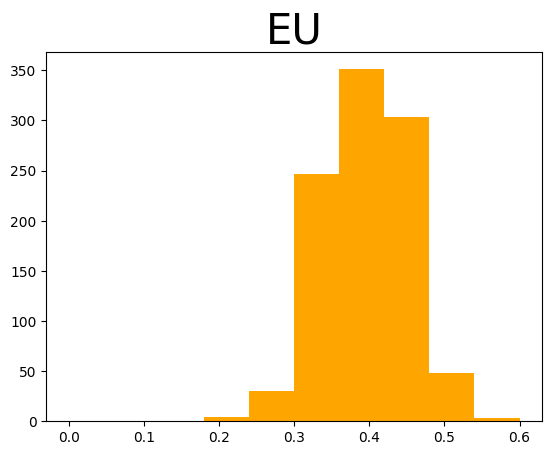

In [265]:
find_closeness(eu)

Mean = 0.1


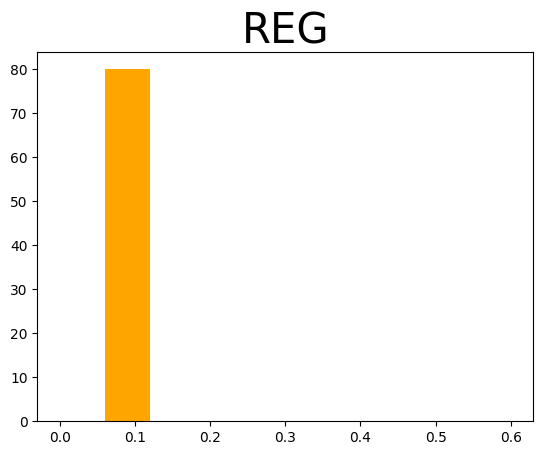

In [267]:
find_closeness(REG)

Mean = 0.42


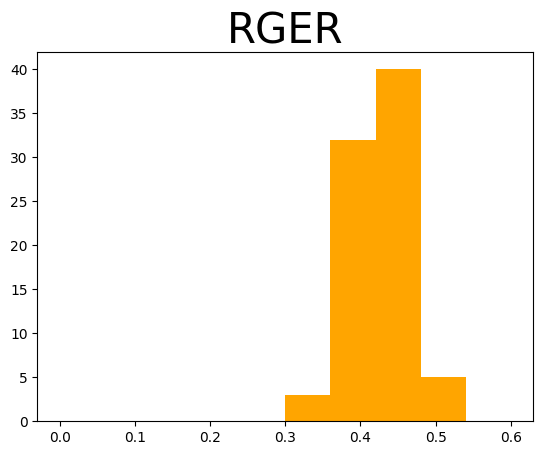

In [269]:
find_closeness(RGER)

Mean = 0.36


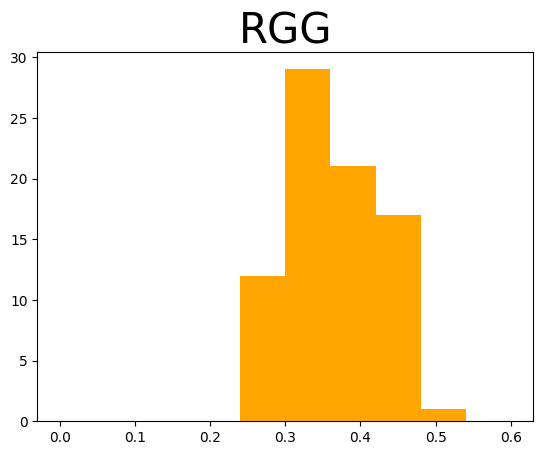

In [271]:
find_closeness(RGG)

Mean = 0.44


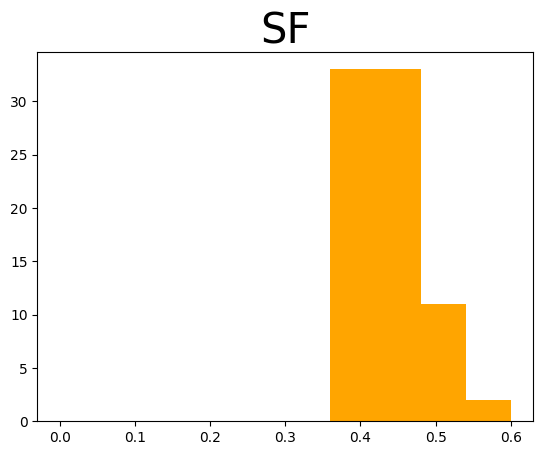

In [273]:
find_closeness(SF)

Mean = 0.28


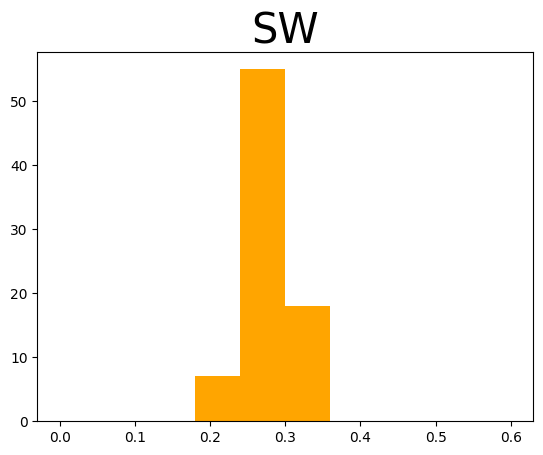

In [275]:
find_closeness(SW)

Σχόλια και Συμπεράσματα

Football

Παρατηρούμε ότι η αναπαράσταση του γράφου μοιάζει με αυτές των RGER, RGG. Κατά τη μελέτη βαθμών κόμβων βλέπουμε ότι η κατανομή έχει ένα μέγιστο και μικρή διασπορά, όπως συμβαίνει επίσης στην RGER. Η κατανομή του συντελεστή ομαδοποίησης προσεγγίζει περισσότερο την RGG καθώς έχει υψηλή μέση τιμή και υψηλές τιμές γύρω από το μέγιστο που παρουσιάζει, ενώ στην RGER η κατανομή γύρω από το μέγιστο φθίνει περισσότερο. Τέλος η μικρή διασπορά και το μεγάλο μέγιστο την κατανομή κεντρικότητας εγγύτητας είναι και πάλι χαρακτηριστικό της RGER. 
Με βάση το είδος της τοπολογίας τα παραπάνω χαρακτηριστικά είναι αναμενόμενα διότι εφόσον πρόκειται για πρωτάθλημα ποδοσφαίρου όπου όλες οι ομάδες παίζουν τους ίδιους αγώνες είναι φυσικό οι περισσότεροι κόμβοι να έχουν τον ίδιο βαθμό και εφόσον όλες οι ομάδες παίζουν με όλες η κεντρικότητα εγγύτητας θα είναι ίδια για τους περισσότερους κόμβους.
Συνολικά θα χαρακτηρίζαμε αυτή την τοπολογία ως RGER με στοιχεία απο RGG.



Game of Thrones

Στην αναπαράσταση του γράφου παρατηρούνται κόμβοι με μεγάλο βαθμό γεγονός που τον κάνει να μοιάζει με την SF τοπολογία. Παρουσιάζει φθίνουσα κατανομή βαθμού κόμβου με μεγάλη διασπορά. επίσης χαρακτηριστικό της SF. Από την άλλη η υψηλή μέση τιμή του συντελεστή ομαδοποίησης και η κατανομή του παραπέμπουν πιο πολύ σε RGG. Σχετικά με την κεντρικότητα εγγύτητας παρατηρούμε λίγους κόμβους με μεγάλη κεντρικότητα και τους περισσότερους με μικρή, όπως και η SF.
Δεδομένου του περιεχομένου του γράφου είναι αναμενόμενη η δημιουργία κοινοτήτων μεταξύ των χαρακτήρων (πχ συγγενικών προσώπων) αλλά και η ύπαρξη κόμβων με μεγάλη κεντρικότητα λόγω των πρωταγονιστικών προσώπων.
Συνολικά θα χαρακτηρίζαμε την τοπολογία ως SF με χαρακτηριστικά από RGG.



EU emails

Η κυκλική αναπαράσταση του γράφου μοιάζει πολύ με την SF. Παρατηρείται και εδώ φθίνουσα κατανομή κόμβου με μεγάλη διασπορά όπως στην SF ενώ η μέση τιμή του συντελεστή ομαδοποίησης είναι μεν μεγαλύτερη από αυτή του SF αλλά οι δύο κατανομές έχουν πολύ παρόμοια δομή. Τέλος η κατανομή της κεντρικότητας χαρακτηρίζεται από λίγους κόμβους με μεγάλη κεντρικότητα και πολλούς με μικρότερη και μοιάζει αρκετά και με RGER και με SF.
Σύμφωνα με τα παραπάνω χαρακτηριστικά η τοπολογία αποτελείται από λίγους κεντρικούς κόμβους που δέχονται πολλά emails ενώ παρατηρείται και μια σχετική ομαδοποίηση που θα μπορούσε να οφείλεται σε τμήματα του οργανισμού.
Συνολικά θα χαρακτηρίζαμε την τοπολογία ως SF.

<h3>B. Εξοικείωση με τα εργαλεία εντοπισμού κοινοτήτων</h3>
<ol>
<li>Χρησιμοποιώντας τις συναρτήσεις του <b>πίνακα 2</b> για κάθε <u>πραγματικό</u> (<b>πίνακας 1</b>) και <u>συνθετικό</u> (από την <b>άσκηση 1</b>) δίκτυο:</p>
<ol>
    <li>να οπτικοποιηθούν οι κοινότητες που προκύπτουν από την κάθε μέθοδο,</li>
    <li>να γίνουν οι απαραίτητοι σχολιασμοί (π.χ: σύγκριση του αριθμού των κοινοτήτων που υπολογίζει ο κάθε αλγόριθμος).</li>
</ol>
<p>Για την οπτικοποίηση, να επισημανθεί διαφορετικά κάθε κοινότητα, π.χ. με διαφορετικό χρώμα.</p>
<p style=text-align:justify>Στην περίπτωση των συνθετικών δικτύων, να πραγματοποιηθούν συγκρίσεις και μεταξύ των διαφορετικών τύπων τοπολογιών. Για παράδειγμα, στην περίπτωση του τυχαίου γεωμετρικού γράφου, υπάρχει διαισθητικά μία κοινότητα γύρω από κάθε κόμβο που δημιουργείται με βάση τις αποστάσεις του τελευταίου από τους υπόλοιπους κόμβους του δικτύου. Στην περίπτωση των scale-free δικτύων, είναι πιθανό να σχηματίζονται κοινότητες γύρω από τους κόμβους με μεγάλο βαθμό.</p>
<li>Για κάθε αλγόριθμο εντοπισμού κοινοτήτων και για κάθε τοπολογία αξιολογήστε την ποιότητα της διαμέρισης με τις μετρικές performance και modularity (<a style=text-decoration:none href='https://networkx.org/documentation/stable/reference/algorithms/community.html#module-networkx.algorithms.community.quality'>measuring_partitions</a>). Για την μετρική performance, θα χρησιμοποιήσετε την συνάρτηση partition_quality του networkx.</li>
<li>Για την μεγαλύτερη συνδεδεμένη συνιστώσα του email-Eu-core, να συγκρίνετε την ground-truth διαμέριση που δίνεται στο αρχείο Email-Eu-core-department-labels.txt με τις διαμερίσεις που προκύπτουν από τις εξεταζόμενες μεθόδους ως προς το πλήθος των παραγόμενων κοινοτήτων και ως προς τις μετρικές performance και modularity. </li>
<li>Για την παρακολούθηση του χρόνου εκτέλεσης της υλοποίησής σας, μπορείτε να χρησιμοποιήσετε την βιβλιοθήκη <a style=text-decoration:none href='https://tqdm.github.io/'>tqdm</a>. Στο σχολιασμό σας να λάβετε υπόψη το trade-off της ποιότητας της διαμέρισης και του χρόνου εκτέλεσης των εξεταζόμενων αλγορίθμων. </li>
</ol>

<table style=float:left;width:70%>
    <caption>Πίνακας <b>2</b>: Συναρτήσεις εντοπισμού κοινοτήτων</caption>
    <tr>
        <th style=text-align:left> Μέθοδος εντοπισμού κοινοτήτων</th>
        <th style=text-align:left>Συνάρτηση</th>
    </tr>
    <tr>
        <td style=text-align:left>Spectral Clustering</td>
        <td style=text-align:left><a style=text-decoration:none href='http://scikit-learn.org/stable/modules/generated/sklearn.cluster.SpectralClustering.html'>SpectralClustering</a></td>
    </tr>
       <tr>
        <td style=text-align:left>Newman-Girvan</td>
        <td style=text-align:left><a style=text-decoration:none                               href='https://networkx.github.io/documentation/latest/reference/algorithms/generated/networkx.algorithms.community.centrality.girvan_newman.html'>girvan_newman</a></td>
    </tr>
    <tr>
        <td style=text-align:left>Modularity Maximization</td>
        <td style=text-align:left><a style=text-decoration:none                               href='https://networkx.github.io/documentation/latest/reference/algorithms/generated/networkx.algorithms.community.modularity_max.greedy_modularity_communities.html'>greedy_modularity_communities</a></td>
    </tr>
</table>
    

<p style=text-align:justify>Προτού εφαρμόσετε τις συναρτήσεις εντοπισμού κοινοτήτων μελετήστε προσεκτικά την <b>είσοδο που απαιτούν καθώς και τη μορφή εξόδου που παράγουν.</b></p>

In [277]:
#Χρησιμοποιήστε την συνάρτηση conv2int για να μετατρέψετε τα labels των κόμβων στις πραγματικ΄ές τοπολογίες σε integers
def conv2int(G,start_value=0):
    nG = nx.convert_node_labels_to_integers(G,first_label=start_value)
    G_mapping=dict(enumerate(G.nodes,0))
    return nG,G_mapping

In [279]:
def colors2partition(G_colors, G_dict): 
  partitions = []
  for i, color in enumerate(G_colors): 
    if (color+1 > len(partitions)):
      partitions.append({G_dict.get(i)})
    else:  
      partitions[color].add(G_dict.get(i))

  return partitions

<h4> Ορισμός χρωμάτων για την οπτικοποίηση των κοινοτήτων.</h4>

In [281]:
#insert colors for nodes
from matplotlib import colors as mcolors
colors = list(dict(mcolors.BASE_COLORS, **mcolors.CSS4_COLORS).keys())
print(colors)

['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w', 'aliceblue', 'antiquewhite', 'aqua', 'aquamarine', 'azure', 'beige', 'bisque', 'black', 'blanchedalmond', 'blue', 'blueviolet', 'brown', 'burlywood', 'cadetblue', 'chartreuse', 'chocolate', 'coral', 'cornflowerblue', 'cornsilk', 'crimson', 'cyan', 'darkblue', 'darkcyan', 'darkgoldenrod', 'darkgray', 'darkgreen', 'darkgrey', 'darkkhaki', 'darkmagenta', 'darkolivegreen', 'darkorange', 'darkorchid', 'darkred', 'darksalmon', 'darkseagreen', 'darkslateblue', 'darkslategray', 'darkslategrey', 'darkturquoise', 'darkviolet', 'deeppink', 'deepskyblue', 'dimgray', 'dimgrey', 'dodgerblue', 'firebrick', 'floralwhite', 'forestgreen', 'fuchsia', 'gainsboro', 'ghostwhite', 'gold', 'goldenrod', 'gray', 'green', 'greenyellow', 'grey', 'honeydew', 'hotpink', 'indianred', 'indigo', 'ivory', 'khaki', 'lavender', 'lavenderblush', 'lawngreen', 'lemonchiffon', 'lightblue', 'lightcoral', 'lightcyan', 'lightgoldenrodyellow', 'lightgray', 'lightgreen', 'lightgrey', 'ligh

<h4>Εντοπισμός κοινοτήτων σε συνθετικά και πραγματικά δίκτυα με τη μέθοδο Newman-Girvan.</h4>
<p>Παράξτε τις διαμερίσεις που προκύπτουν από την μέθοδο Newman-Girvan. Ελέγξτε τις διαμερίσεις που έχουν μέχρι και 50 κοινότητες.</p>
<p> Επιλέξτε τις διαμερίσεις με το 1) μεγαλύτερο modularity score και 2) performance score για κάθε πραγματικό και συνθετικό δίκτυο.</p>

In [283]:
import itertools as itools

def newman_girvan(G, metric=nx.algorithms.community.modularity): 
  n_communities = 50
  best_partition=None; best_partition_n=None; best_score=0
  iterations = nx.algorithms.community.centrality.girvan_newman(G) 
  partitions = itools.takewhile(lambda i: len(i) <= n_communities, iterations) 
  for partition in tqdm(partitions):
    partition_score = metric(G, list(partition))
    if (type(partition_score) is tuple): 
      partition_score = partition_score[1]
    if (partition_score > best_score): 
      best_partition = partition; best_partition_n = len(partition); best_score = partition_score

  print("Communities: ", best_partition_n, ", Metric Score: ", best_score)
  
  return len(best_partition), best_partition 

In [285]:
def colors_newman_girvan(G, metric=nx.algorithms.community.modularity):
  colors_list = np.zeros(len(G.nodes())) 
  nodes_list = list(G.nodes())
  
  n_nodes, partitions_G = newman_girvan(G, metric) 
  partition_no = 0
  for partition in partitions_G:
    for node in partition:
      colors_list[nodes_list.index(node)] = partition_no
    partition_no+=1
  return colors_list

<h4>Εντοπισμός κοινοτήτων σε συνθετικά και πραγματικά δίκτυα με τη μέθοδο Spectral Clustering. </h4>
Προσοχή! Για την επιλογή της τιμής της παραμέτρου που αφορά στην διάσταση του projection subspace (n_clusters) της συνάρτησης SpectralClustering, θα πρέπει να λάβετε υπόψη το μέγεθος |V| του εκάστοτε δικτύου.
<p>Να εξετάσετε τις διαμερίσεις που προκύπτουν για n_clusters$=2,...,50 Να επιλέξετε για οπτικοποίηση τις διαμερίσεις με το 1) μεγαλύτερο modularity score και 2) performance score για κάθε πραγματικό και συνθετικό δίκτυο.</p>

In [287]:
def spectral_clustering(G, metric=nx.algorithms.community.modularity):
  G_new, G_dict = conv2int(G) 
  adj_matrix = np.asarray(nx.to_numpy_array(G_new)) 

  n_communities_list = list(range(2, 51)) 
  best_partition=None; best_partition_n=None; best_score=0
  for n_communities in tqdm(n_communities_list):
    clustering = SpectralClustering(
        n_clusters = n_communities,
        assign_labels='discretize',
        affinity='precomputed',
        random_state=0
    )
    communities = clustering.fit_predict(adj_matrix) 

    partition = colors2partition(communities, G_dict) 
    partition_score = metric(G, list(partition))
    if (type(partition_score) is tuple): 
      partition_score = partition_score[1]
    if (partition_score > best_score): 
      best_partition = communities; best_partition_n = n_communities; best_score = partition_score

  print("Communities: ", best_partition_n, ", Metric Score: ", best_score)

  return best_partition 

<h4>Εντοπισμός κοινοτήτων σε συνθετικά και πραγματικά δίκτυα με τη μέθοδο Modularity Maximization.</h4>
Για την διαμέριση που θα προκύψει σε κάθε συνθετικό και πραγματικό δίκτυο, να υπολογίσετε το modularity score και το performance score.

In [289]:
def modularity_maximization(G):
  start_time = time.time()
  communities = nx.algorithms.community.greedy_modularity_communities(G)
  print("--- %s seconds ---" % (time.time() - start_time))
  print("Communities: ", len(communities), ", Modularity : ", nx.algorithms.community.modularity(G, communities), ", Performance : ", nx.algorithms.community.partition_quality(G, communities)[1])

  return communities

In [291]:
def colors_modularity_maximization(G):
  partitions_G = modularity_maximization(G)
  colors_list = np.zeros(len(G.nodes())) 
  nodes_list = list(G.nodes())

  partition_no = 0
  for partition in partitions_G:
      for node in partition:
        colors_list[nodes_list.index(node)] = partition_no
      partition_no+=1

  return colors_list

In [293]:
import warnings
warnings.filterwarnings('ignore')

In [295]:
# NEWMAN-GIRVAN 
def draw_newman_girvan(title, G, metric, a, b):
  plt.figure(figsize=(18, 6))
  plt.title(title, fontsize=20)
  pos = nx.kamada_kawai_layout(G)
  nx.draw_networkx_edges(G, pos, alpha=0.3)

  node_sizes = []
  for n in G.degree():
    node_sizes.append(a * n[1]**b)
  
  nx.draw_networkx_nodes(
      G, 
      pos, 
      nodelist=[n for n in G.nodes()],
      node_size=node_sizes,
      node_color=colors_newman_girvan(G, metric),
      cmap=plt.cm.rainbow,
  )

  labels={}
  for n in G.nodes():
    if G.degree(n) > 11:
      labels[n] = str(n)
    else:
      labels[n] = ''
  nx.draw_networkx_labels(G, pos, labels, font_size=10)
  plt.show()

In [297]:
# SPECTRAL CLUSTERING 
def draw_spectral_clustering(title, G, metric, a, b):
  plt.figure(figsize=(18, 6))
  plt.title(title, fontsize=20)
  pos = nx.kamada_kawai_layout(G)
  nx.draw_networkx_edges(G, pos, alpha=0.3)

  node_sizes = []
  for n in G.degree():
    node_sizes.append(a * n[1]**b)
    
  nx.draw_networkx_nodes(
      G, 
      pos, 
      nodelist=[n for n in G.nodes()],
      node_size=node_sizes,
      node_color=spectral_clustering(G, metric),
      cmap=plt.cm.rainbow,
  )

  labels={}
  for n in G.nodes():
    if G.degree(n) > 11:
      labels[n] = str(n)
    else:
      labels[n] = ''
  nx.draw_networkx_labels(G, pos, labels, font_size=10)
  plt.show()

In [299]:
# MODULARITY MAXIMIZATION 
def draw_modularity_maximization(title, G, a, b):
  plt.figure(figsize=(18, 6))
  plt.title(title, fontsize=20)
  pos = nx.kamada_kawai_layout(G)
  nx.draw_networkx_edges(G, pos, alpha=0.3)

  node_sizes = []
  for n in G.degree():
    node_sizes.append(a * n[1]**b)
    
  nx.draw_networkx_nodes(
      G, 
      pos, 
      nodelist=[n for n in G.nodes()],
      node_size=node_sizes,
      node_color=colors_modularity_maximization(G),
      cmap=plt.cm.rainbow,
  )

  labels={}
  for n in G.nodes():
    if G.degree(n) > 11:
      labels[n] = str(n)
    else:
      labels[n] = ''
  nx.draw_networkx_labels(G, pos, labels, font_size=10)
  plt.show()

#### Οπτικοποίηση κοινοτήτων American College Football

49it [00:05,  8.93it/s]


Communities:  10 , Metric Score:  0.5996290274077958


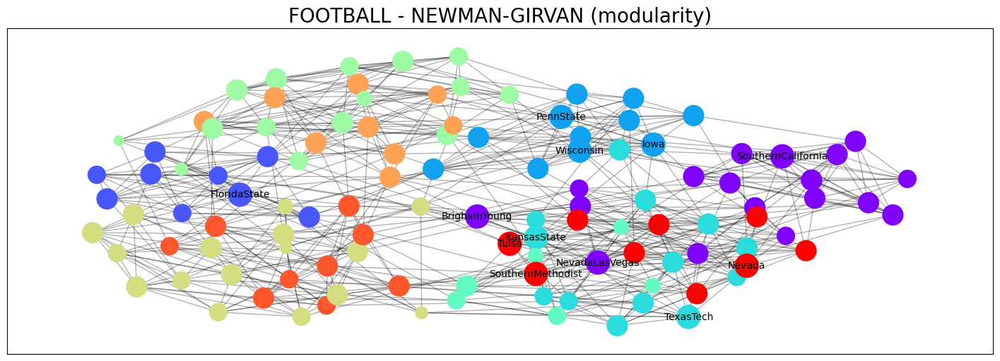

49it [00:06,  7.09it/s]


Communities:  17 , Metric Score:  0.9581998474446987


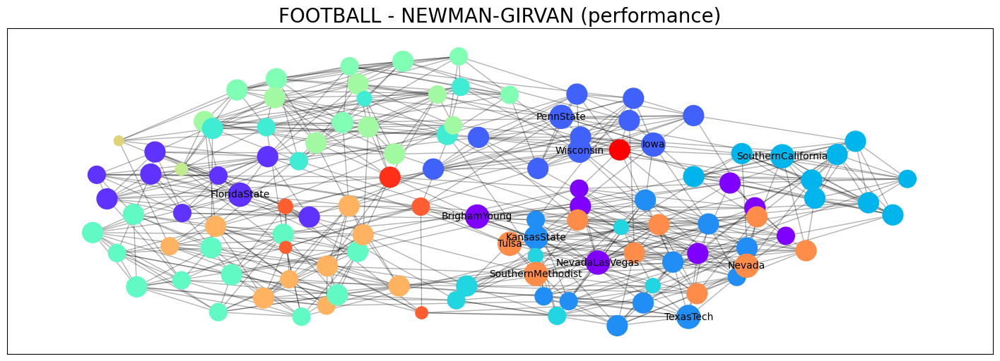

100%|██████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 87.13it/s]


Communities:  9 , Metric Score:  0.5740521437372428


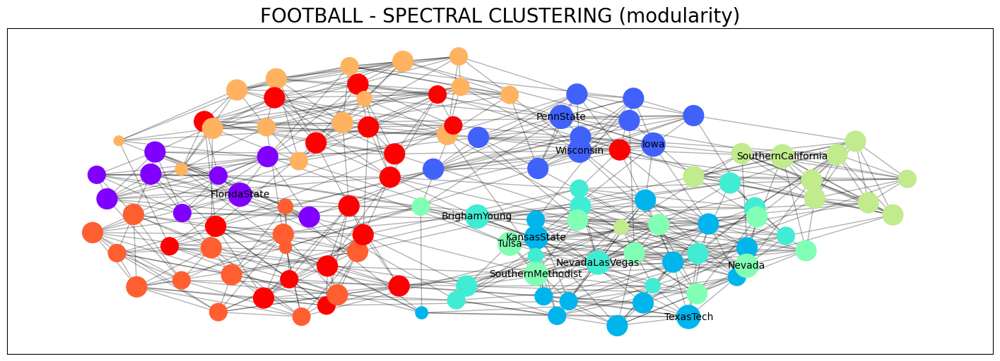

100%|█████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 105.94it/s]


Communities:  14 , Metric Score:  0.9411136536994661


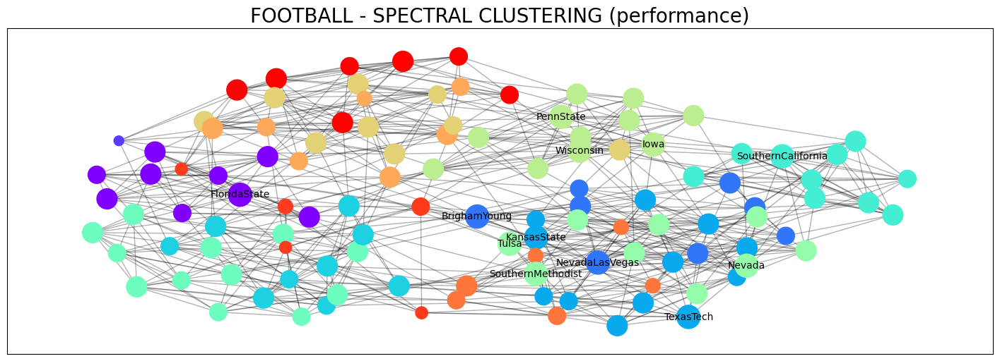

--- 0.030297517776489258 seconds ---
Communities:  6 , Modularity :  0.5564043335134086 , Performance :  0.8684973302822273


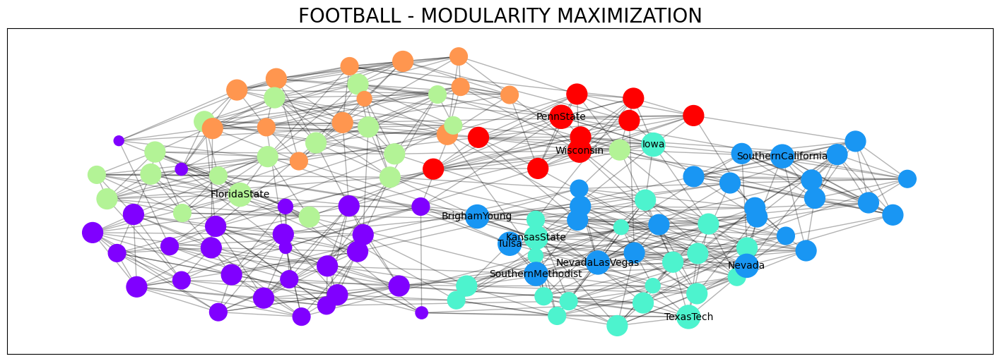

In [301]:
# NEWMAN-GIRVAN 
draw_newman_girvan("FOOTBALL - NEWMAN-GIRVAN (modularity)", football, nx.algorithms.community.modularity, 0.2, 3.2)
draw_newman_girvan("FOOTBALL - NEWMAN-GIRVAN (performance)", football, nx.algorithms.community.partition_quality, 0.2, 3.2)

# SPECTRAL CLUSTERING 
draw_spectral_clustering("FOOTBALL - SPECTRAL CLUSTERING (modularity)", football, nx.algorithms.community.modularity, 0.2, 3.2)
draw_spectral_clustering("FOOTBALL - SPECTRAL CLUSTERING (performance)", football, nx.algorithms.community.partition_quality, 0.2, 3.2)

# MODULARITY MAXIMIZATION
draw_modularity_maximization("FOOTBALL - MODULARITY MAXIMIZATION", football, 0.2, 3.2)

#### Οπτικοποίηση κοινοτήτων Game of Thrones

49it [00:01, 24.82it/s]


Communities:  8 , Metric Score:  0.6681205999387818


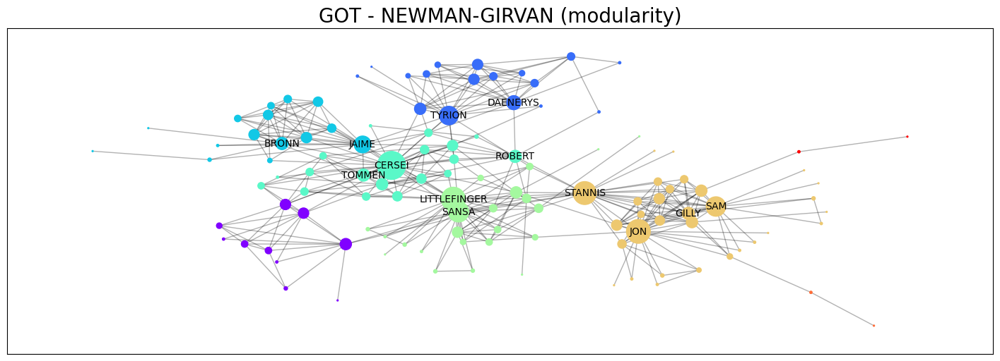

49it [00:01, 25.38it/s]


Communities:  50 , Metric Score:  0.96425010682239


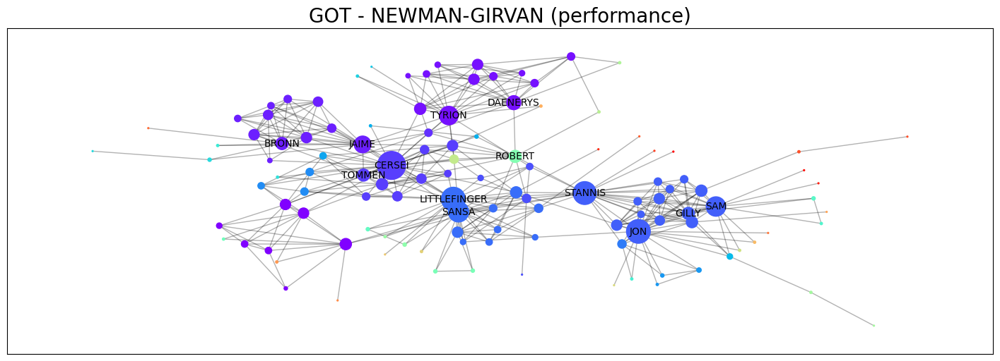

100%|██████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 34.44it/s]

Communities:  7 , Metric Score:  0.584191026425875


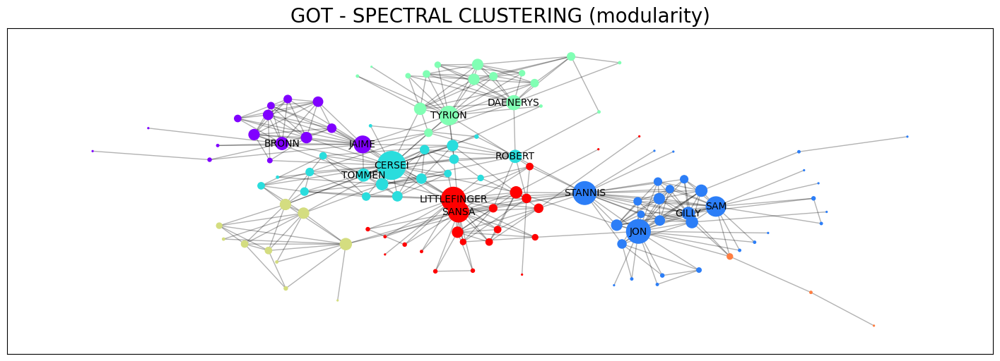

100%|██████████████████████████████████████████████████████████████████████████████████| 49/49 [00:01<00:00, 27.60it/s]

Communities:  36 , Metric Score:  0.9408916108816407


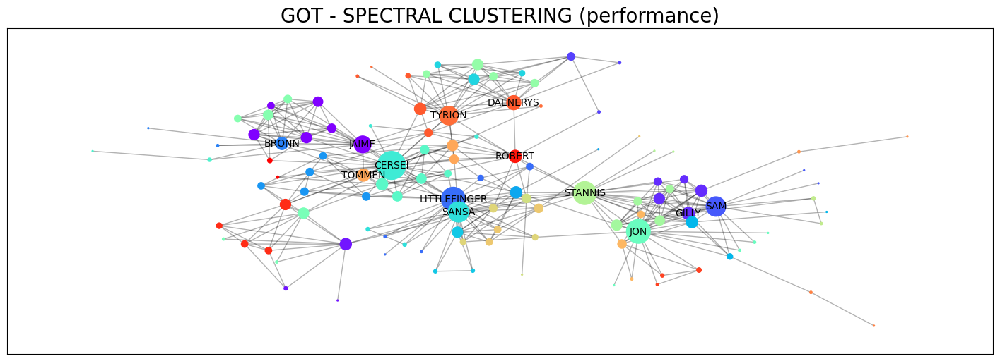

--- 0.027042388916015625 seconds ---
Communities:  5 , Modularity :  0.660477884909703 , Performance :  0.829796325309785


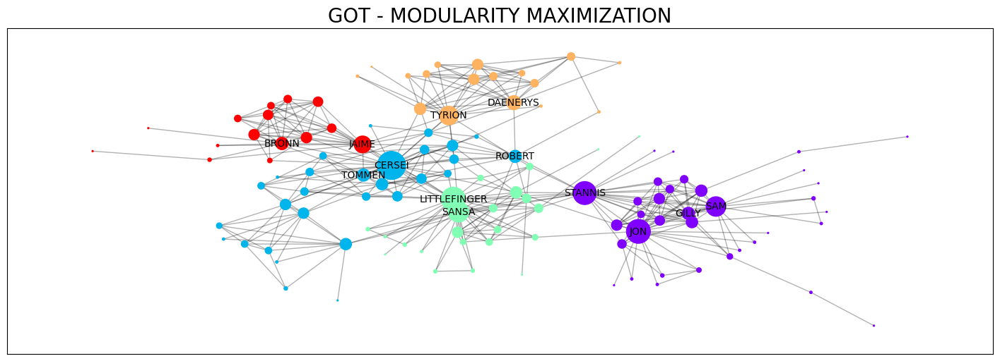

In [303]:
# NEWMAN-GIRVAN 
draw_newman_girvan("GOT - NEWMAN-GIRVAN (modularity)", got, nx.algorithms.community.modularity, 1.8, 1.8)
draw_newman_girvan("GOT - NEWMAN-GIRVAN (performance)", got, nx.algorithms.community.partition_quality, 1.8, 1.8)

# SPECTRAL CLUSTERING 
draw_spectral_clustering("GOT - SPECTRAL CLUSTERING (modularity)", got, nx.algorithms.community.modularity, 1.8, 1.8)
draw_spectral_clustering("GOT - SPECTRAL CLUSTERING (performance)", got, nx.algorithms.community.partition_quality, 1.8, 1.8)

# MODULARITY MAXIMIZATION
draw_modularity_maximization("GOT - MODULARITY MAXIMIZATION", got, 1.8, 1.8)

#### Οπτικοποίηση κοινοτήτων email-Eu-core (να οπτικοποιηθεί και η ground-truth διαμέριση)

In [305]:
pos_eu = nx.kamada_kawai_layout(eu)

49it [10:01, 12.29s/it]


Communities:  2 , Metric Score:  0.0006218821799455388


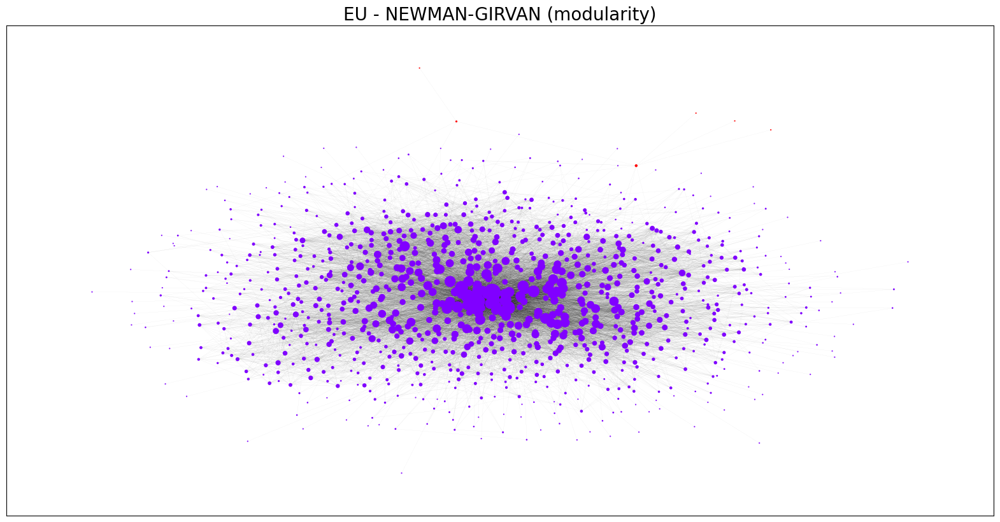

49it [10:12, 12.50s/it]


Communities:  50 , Metric Score:  0.13940548388093205


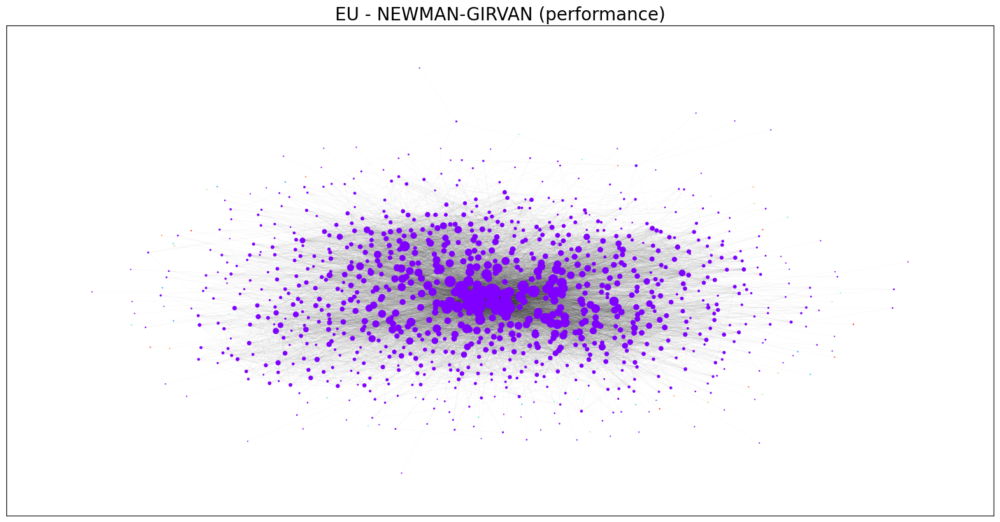

In [307]:
# NEWMAN-GIRVAN 
plt.figure(figsize=(20, 10))
plt.title("EU - NEWMAN-GIRVAN (modularity)", fontsize=20)
nx.draw_networkx_edges(eu, pos_eu, width=0.05, alpha=0.3)

node_sizes = []
for n in eu.degree():
  node_sizes.append(0.3 * n[1]**1.2)

nx.draw_networkx_nodes(
    eu, 
    pos_eu, 
    nodelist=[n for n in eu.nodes()],
    node_size=node_sizes,
    node_color=colors_newman_girvan(eu, nx.algorithms.community.modularity),
    cmap=plt.cm.rainbow,
)
plt.show()

plt.figure(figsize=(20, 10))
plt.title("EU - NEWMAN-GIRVAN (performance)", fontsize=20)
nx.draw_networkx_edges(eu, pos_eu, width=0.05, alpha=0.3)

node_sizes = []
for n in eu.degree():
  node_sizes.append(0.3 * n[1]**1.2)

nx.draw_networkx_nodes(
    eu, 
    pos_eu, 
    nodelist=[n for n in eu.nodes()],
    node_size=node_sizes,
    node_color=colors_newman_girvan(eu, nx.algorithms.community.partition_quality),
    cmap=plt.cm.rainbow,
)
plt.show()

100%|██████████████████████████████████████████████████████████████████████████████████| 49/49 [00:08<00:00,  5.86it/s]


Communities:  9 , Metric Score:  0.3876932470255928


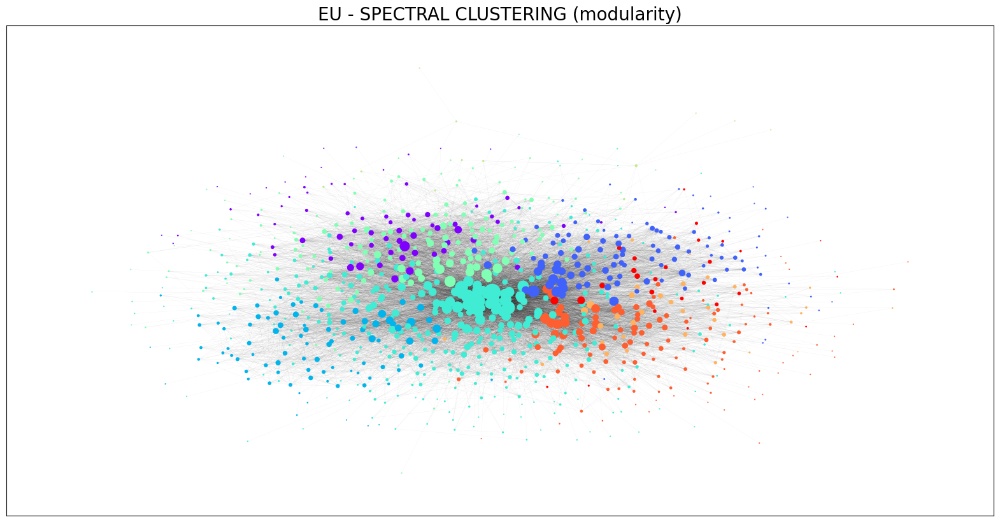

100%|██████████████████████████████████████████████████████████████████████████████████| 49/49 [00:09<00:00,  5.21it/s]


Communities:  48 , Metric Score:  0.953676341882806


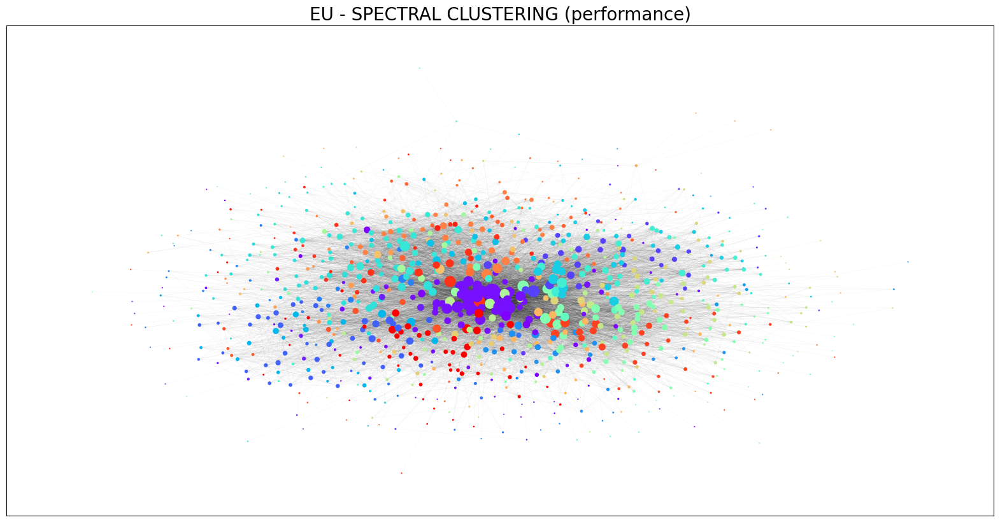

In [309]:
# SPECTRAL CLUSTERING 
plt.figure(figsize=(20, 10))
plt.title("EU - SPECTRAL CLUSTERING (modularity)", fontsize=20)
nx.draw_networkx_edges(eu, pos_eu, width=0.05, alpha=0.3)

node_sizes = []
for n in eu.degree():
  node_sizes.append(0.3 * n[1]**1.2)

nx.draw_networkx_nodes(
    eu, 
    pos_eu, 
    nodelist=[n for n in eu.nodes()],
    node_size=node_sizes,
    node_color=spectral_clustering(eu, nx.algorithms.community.modularity),
    cmap=plt.cm.rainbow,
)
plt.show()

plt.figure(figsize=(20, 10))
plt.title("EU - SPECTRAL CLUSTERING (performance)", fontsize=20)
nx.draw_networkx_edges(eu, pos_eu, width=0.05, alpha=0.3)

node_sizes = []
for n in eu.degree():
  node_sizes.append(0.3 * n[1]**1.2)

nx.draw_networkx_nodes(
    eu, 
    pos_eu, 
    nodelist=[n for n in eu.nodes()],
    node_size=node_sizes,
    node_color=spectral_clustering(eu, nx.algorithms.community.partition_quality),
    cmap=plt.cm.rainbow,
)
plt.show()

--- 2.904088020324707 seconds ---
Communities:  8 , Modularity :  0.3471325650460905 , Performance :  0.7078716240565892


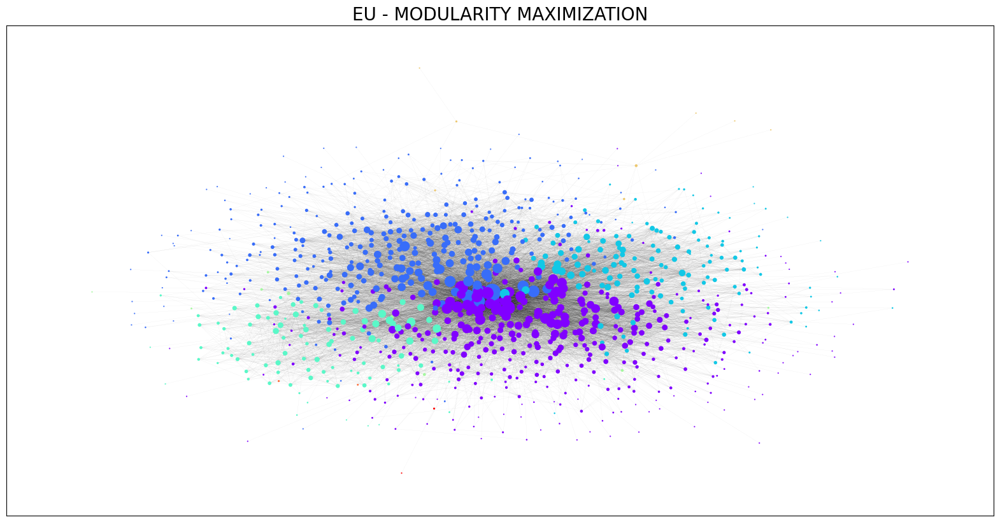

In [311]:
# MODULARITY MAXIMIZATION
plt.figure(figsize=(20, 10))
plt.title("EU - MODULARITY MAXIMIZATION", fontsize=20)
nx.draw_networkx_edges(eu, pos_eu, width=0.05, alpha=0.3)

node_sizes = []
for n in eu.degree():
  node_sizes.append(0.3 * n[1]**1.2)
  
nx.draw_networkx_nodes(
    eu, 
    pos_eu, 
    nodelist=[n for n in eu.nodes()],
    node_size=node_sizes,
    node_color=colors_modularity_maximization(eu),
    cmap=plt.cm.rainbow,
)

plt.show()

GROUND-TRUTH PARTITIONING
Clusters:  42 
Modularity:  0.2898006006913114 
Performance:  0.9427325523775545


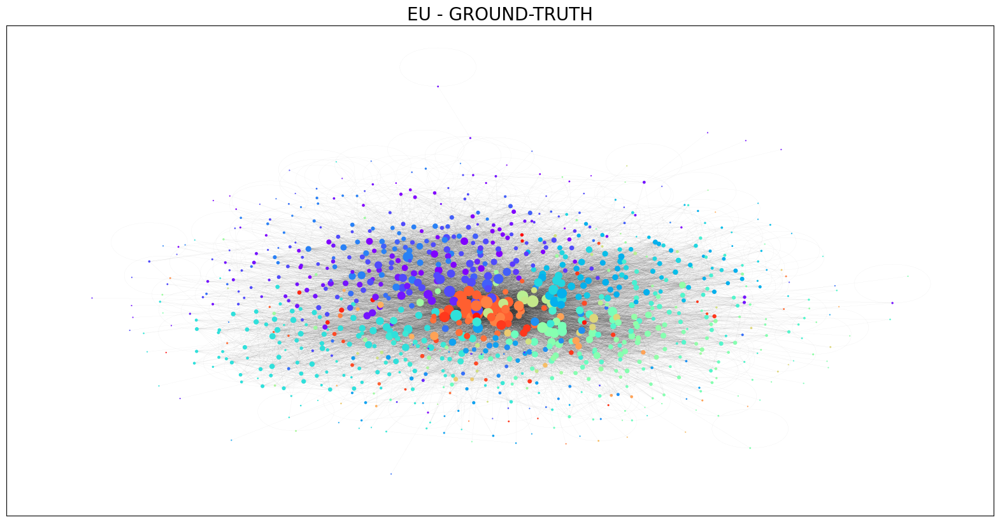

In [322]:
#Ground-Truth
eu_labeled_colors = []
with open('email-Eu-core-department-labels.txt') as txt_file:
  for line in txt_file.readlines():
    node = line.split() 
    eu_labeled_colors.append(int(node[1]))
    
eu_copy_int, eu_copy_dict = conv2int(eu_copy) 
eu_labeled_partition = colors2partition(eu_labeled_colors, eu_copy_dict) 

print("GROUND-TRUTH PARTITIONING")
print("Clusters: ", len(eu_labeled_partition) 
    , "\nModularity: ", nx.algorithms.community.modularity(eu_copy, eu_labeled_partition)
    , "\nPerformance: ", nx.algorithms.community.partition_quality(eu_copy, eu_labeled_partition)[1])


plt.figure(figsize=(20, 10))
plt.title("EU - GROUND-TRUTH", fontsize=20)
pos_eu_copy = nx.kamada_kawai_layout(eu_copy)
nx.draw_networkx_edges(eu_copy, pos_eu_copy, width=0.05, alpha=0.3)

node_sizes = []
for n in eu_copy.degree():
  node_sizes.append(0.3 * n[1]**1.2)

nx.draw_networkx_nodes(
    eu_copy, 
    pos_eu_copy, 
    nodelist=[n for n in eu_copy.nodes()],
    node_size=node_sizes,
    node_color=eu_labeled_colors,
    cmap=plt.cm.rainbow,
)

plt.show()

#### Οπτικοποίηση κοινοτήτων REG

49it [00:00, 161.82it/s]


Communities:  8 , Metric Score:  0.725


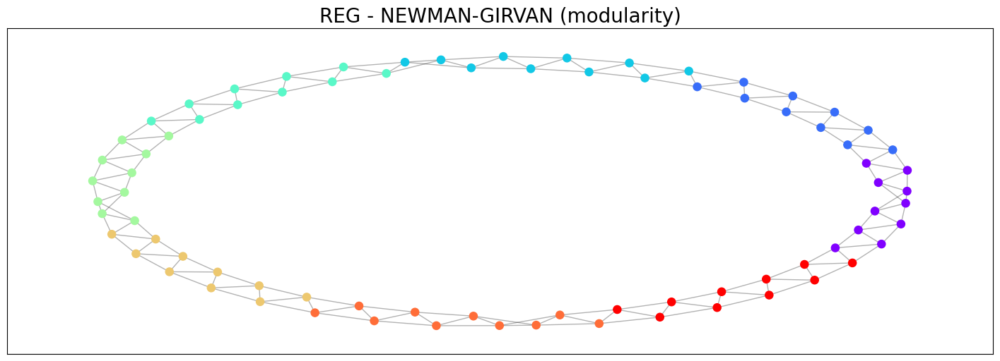

49it [00:00, 172.87it/s]


Communities:  16 , Metric Score:  0.9696202531645569


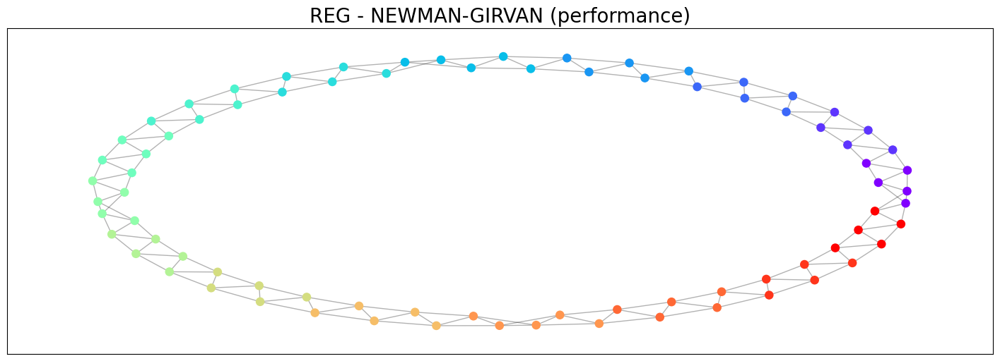

100%|█████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 164.81it/s]


Communities:  7 , Metric Score:  0.6737500000000001


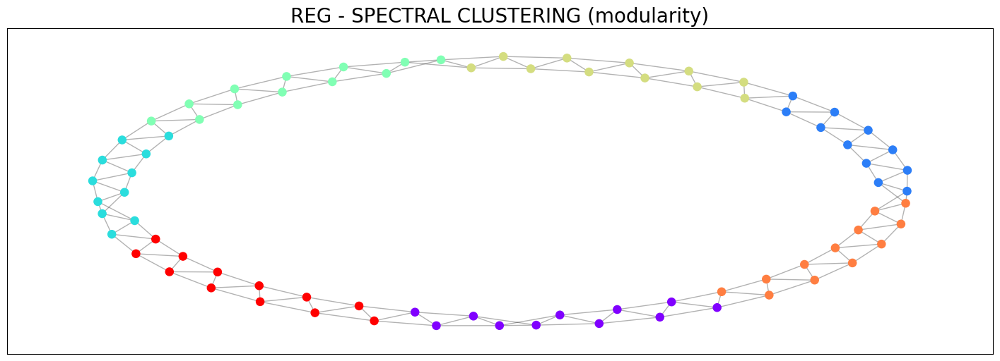

100%|█████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 149.00it/s]

Communities:  27 , Metric Score:  0.9639240506329114


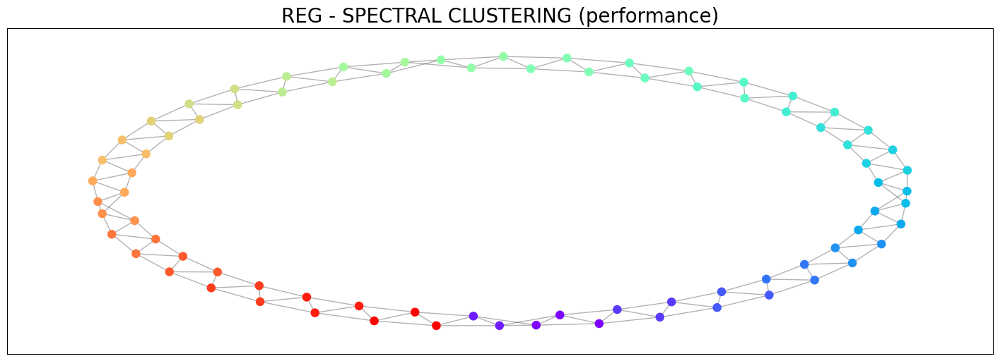

--- 0.0060465335845947266 seconds ---
Communities:  4 , Modularity :  0.673125 , Performance :  0.8006329113924051


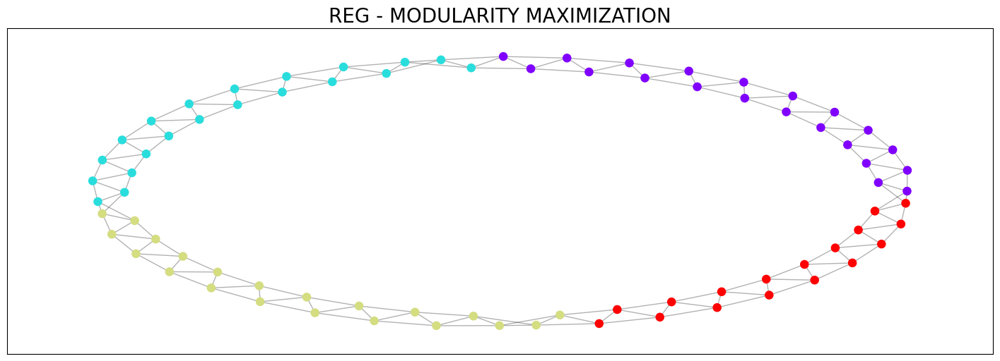

In [312]:
# NEWMAN-GIRVAN 
draw_newman_girvan("REG - NEWMAN-GIRVAN (modularity)", REG, nx.algorithms.community.modularity, 2, 2.5)
draw_newman_girvan("REG - NEWMAN-GIRVAN (performance)", REG, nx.algorithms.community.partition_quality, 2, 2.5)
# SPECTRAL CLUSTERING 
draw_spectral_clustering("REG - SPECTRAL CLUSTERING (modularity)", REG, nx.algorithms.community.modularity, 2, 2.5)
draw_spectral_clustering("REG - SPECTRAL CLUSTERING (performance)", REG, nx.algorithms.community.partition_quality, 2, 2.5)
# MODULARITY MAXIMIZATION
draw_modularity_maximization("REG - MODULARITY MAXIMIZATION", REG, 2, 2.5)

#### Οπτικοποίηση κοινοτήτων RGER

49it [00:01, 25.52it/s]


Communities:  25 , Metric Score:  0.2237111111111111


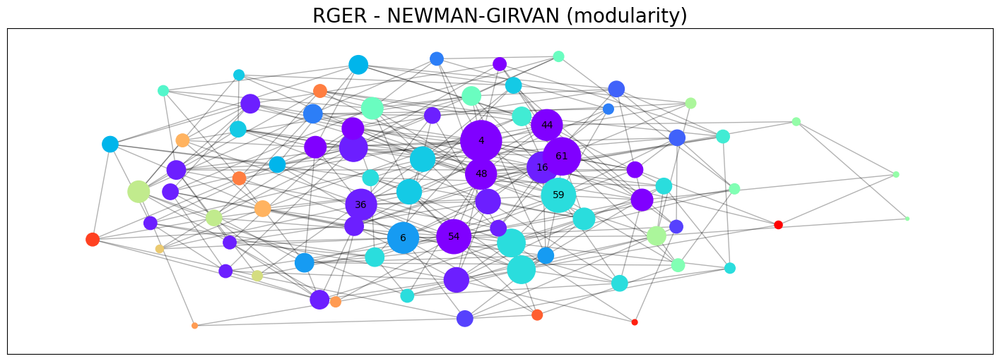

49it [00:01, 25.06it/s]


Communities:  33 , Metric Score:  0.9221518987341772


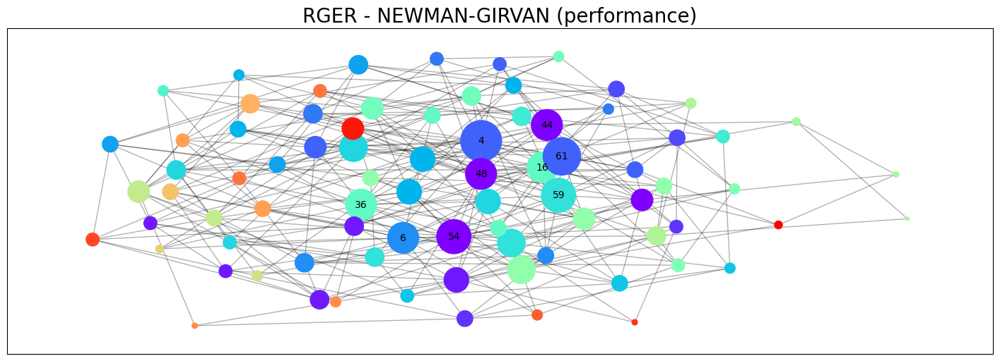

100%|█████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 153.64it/s]


Communities:  6 , Metric Score:  0.26379444444444444


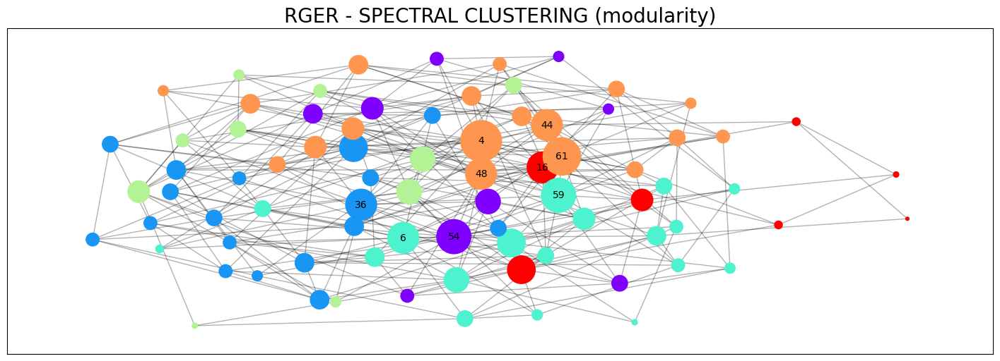

100%|█████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 159.91it/s]


Communities:  27 , Metric Score:  0.9018987341772152


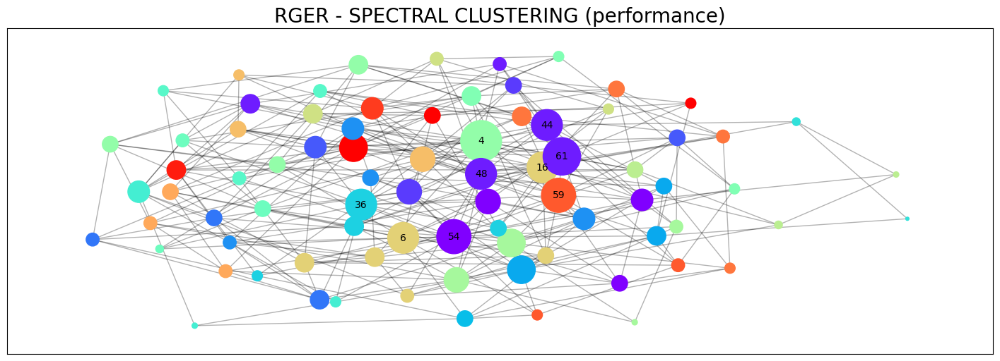

--- 0.018713712692260742 seconds ---
Communities:  6 , Modularity :  0.29625 , Performance :  0.8354430379746836


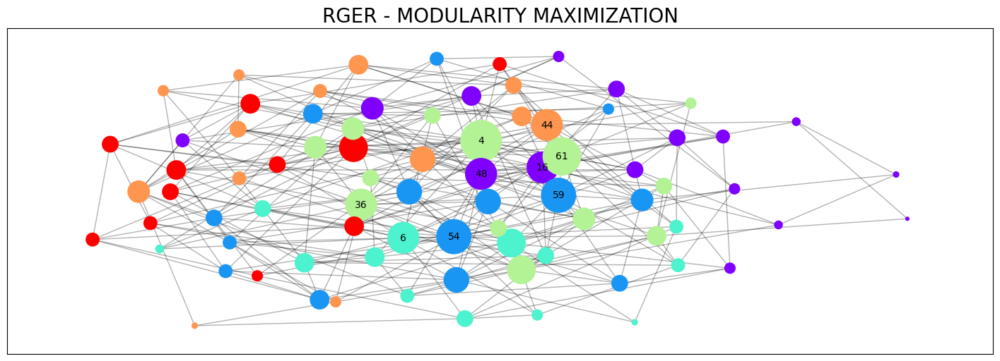

In [313]:
# NEWMAN-GIRVAN 
draw_newman_girvan("RGER - NEWMAN-GIRVAN (modularity)", RGER, nx.algorithms.community.modularity, 2, 2.5)
draw_newman_girvan("RGER - NEWMAN-GIRVAN (performance)", RGER, nx.algorithms.community.partition_quality, 2, 2.5)
# SPECTRAL CLUSTERING 
draw_spectral_clustering("RGER - SPECTRAL CLUSTERING (modularity)", RGER, nx.algorithms.community.modularity, 2, 2.5)
draw_spectral_clustering("RGER - SPECTRAL CLUSTERING (performance)", RGER, nx.algorithms.community.partition_quality, 2, 2.5)
# MODULARITY MAXIMIZATION
draw_modularity_maximization("RGER - MODULARITY MAXIMIZATION", RGER, 2, 2.5)

#### Οπτικοποίηση κοινοτήτων RGG

49it [00:02, 17.77it/s]


Communities:  5 , Metric Score:  0.4845487882653061


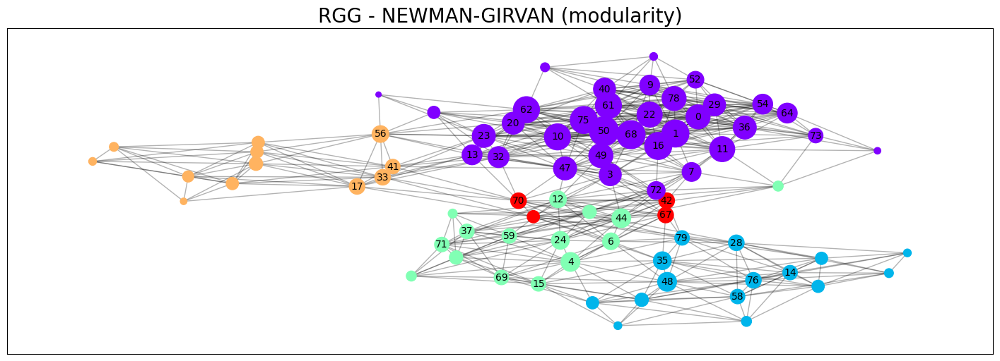

49it [00:02, 18.64it/s]


Communities:  26 , Metric Score:  0.9031645569620254


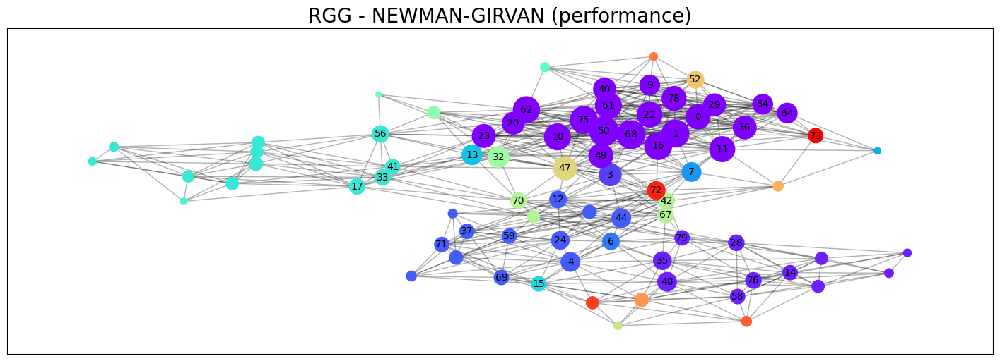

100%|█████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 141.60it/s]


Communities:  4 , Metric Score:  0.5057110969387755


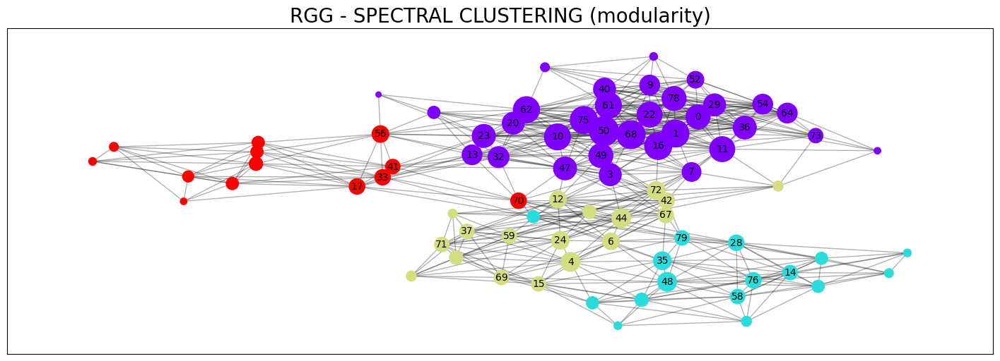

100%|█████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 173.71it/s]


Communities:  7 , Metric Score:  0.8816455696202532


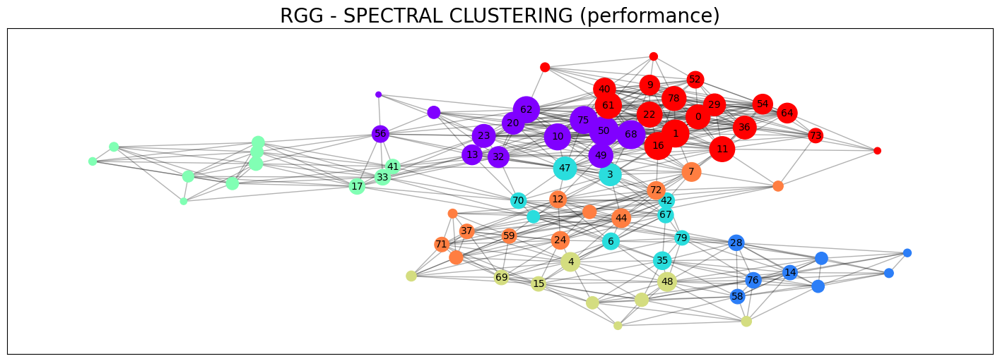

--- 0.015803813934326172 seconds ---
Communities:  3 , Modularity :  0.4387181122448979 , Performance :  0.7541139240506329


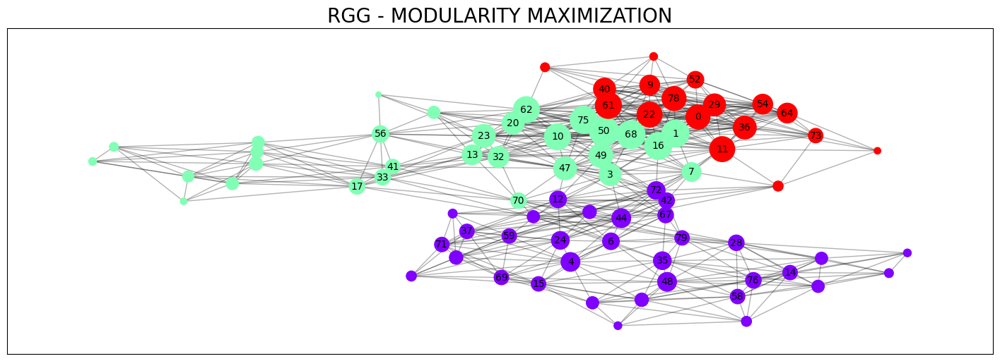

In [314]:
# NEWMAN-GIRVAN 
draw_newman_girvan("RGG - NEWMAN-GIRVAN (modularity)", RGG, nx.algorithms.community.modularity, 2.5, 1.8)
draw_newman_girvan("RGG - NEWMAN-GIRVAN (performance)", RGG, nx.algorithms.community.partition_quality, 2.5, 1.8)
# SPECTRAL CLUSTERING 
draw_spectral_clustering("RGG - SPECTRAL CLUSTERING (modularity)", RGG, nx.algorithms.community.modularity, 2.5, 1.8)
draw_spectral_clustering("RGG - SPECTRAL CLUSTERING (performance)", RGG, nx.algorithms.community.partition_quality, 2.5, 1.8)
# MODULARITY MAXIMIZATION
draw_modularity_maximization("RGG - MODULARITY MAXIMIZATION", RGG, 2.5, 1.8)

#### Οπτικοποίηση κοινοτήτων SW

49it [00:00, 109.86it/s]


Communities:  8 , Metric Score:  0.57900390625


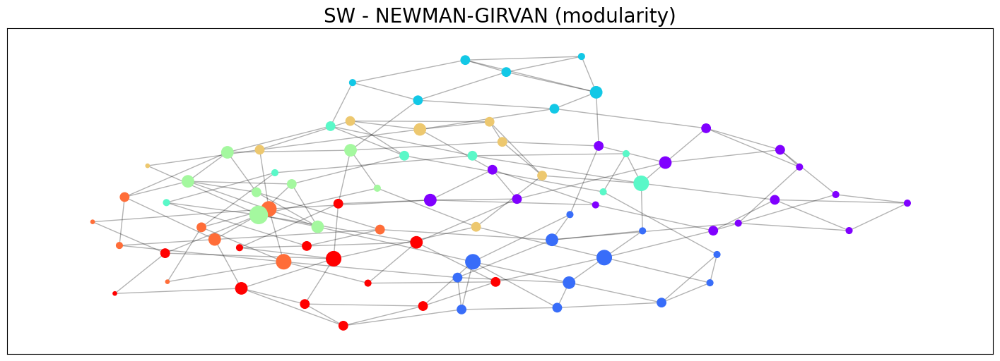

49it [00:00, 113.71it/s]


Communities:  31 , Metric Score:  0.9686708860759494


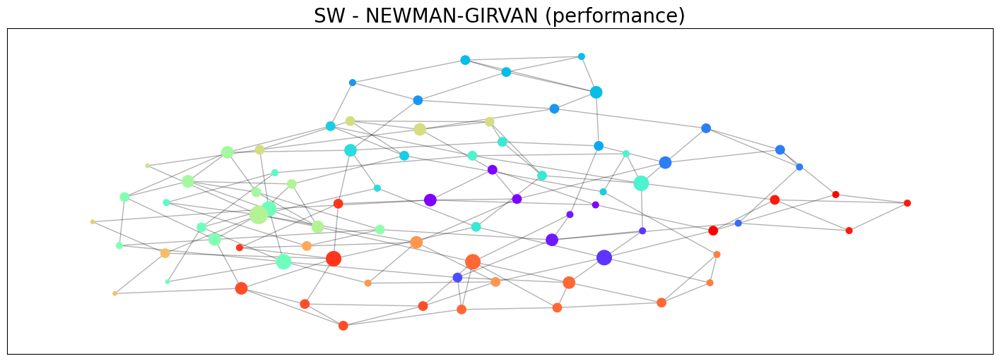

100%|█████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 179.70it/s]


Communities:  11 , Metric Score:  0.51736328125


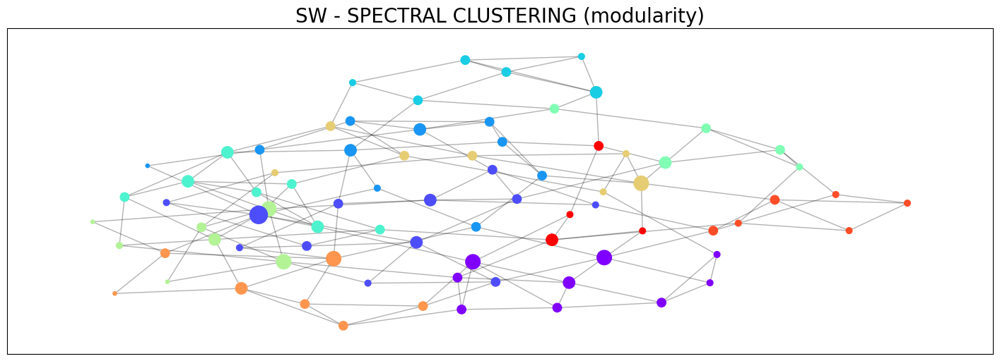

100%|█████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 178.77it/s]


Communities:  32 , Metric Score:  0.9487341772151898


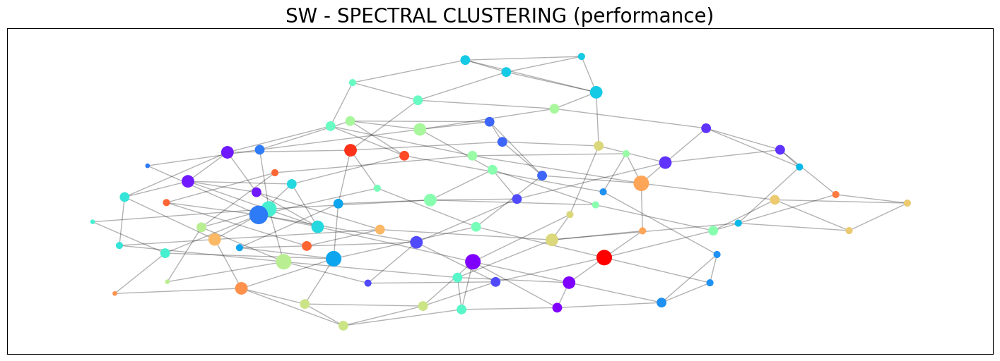

--- 0.007688999176025391 seconds ---
Communities:  8 , Modularity :  0.569375 , Performance :  0.8886075949367088


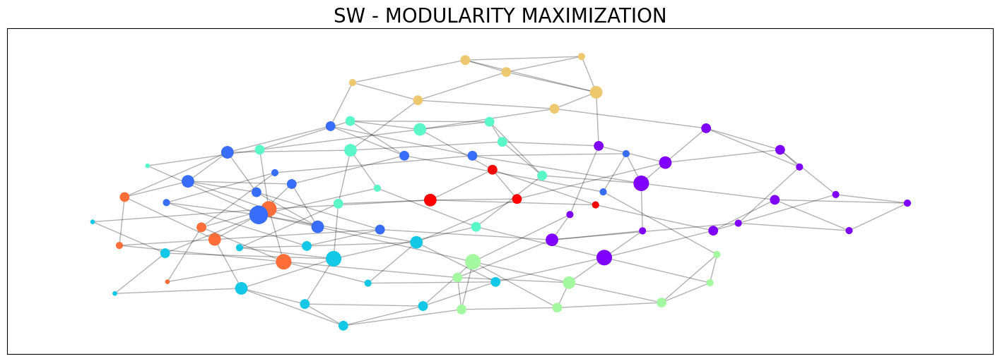

In [315]:
# NEWMAN-GIRVAN 
draw_newman_girvan("SW - NEWMAN-GIRVAN (modularity)", SW, nx.algorithms.community.modularity, 2.5, 2.5)
draw_newman_girvan("SW - NEWMAN-GIRVAN (performance)", SW, nx.algorithms.community.partition_quality, 2.5, 2.5)
# SPECTRAL CLUSTERING 
draw_spectral_clustering("SW - SPECTRAL CLUSTERING (modularity)", SW, nx.algorithms.community.modularity, 2.5, 2.5)
draw_spectral_clustering("SW - SPECTRAL CLUSTERING (performance)", SW, nx.algorithms.community.partition_quality, 2.5, 2.5)
# MODULARITY MAXIMIZATION
draw_modularity_maximization("SW - MODULARITY MAXIMIZATION", SW, 2.5, 2.5)

#### Οπτικοποίηση κοινοτήτων SF

49it [00:01, 25.93it/s]


Communities:  25 , Metric Score:  0.13051311461218837


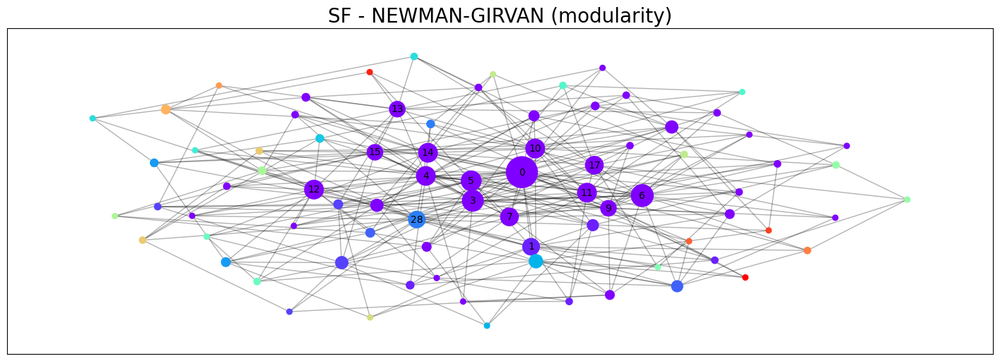

49it [00:02, 23.77it/s]


Communities:  49 , Metric Score:  0.915506329113924


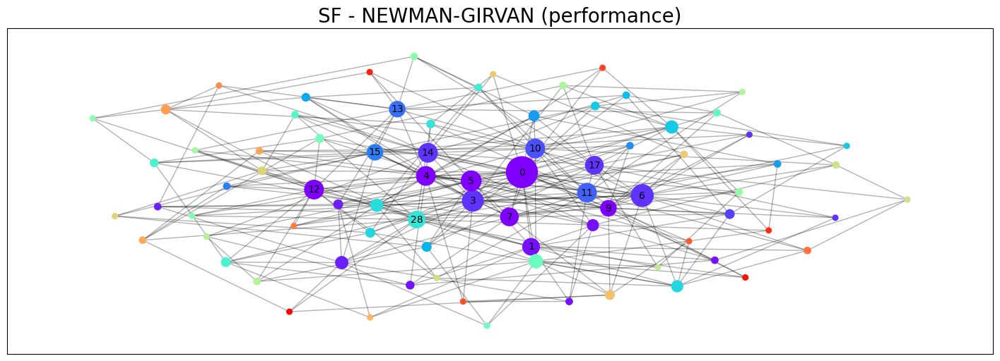

100%|█████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 154.20it/s]


Communities:  5 , Metric Score:  0.22307825484764543


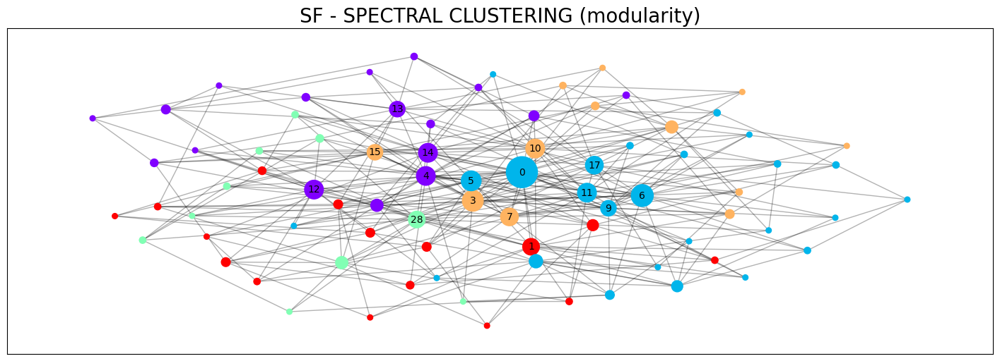

100%|█████████████████████████████████████████████████████████████████████████████████| 49/49 [00:00<00:00, 148.29it/s]


Communities:  30 , Metric Score:  0.8996835443037975


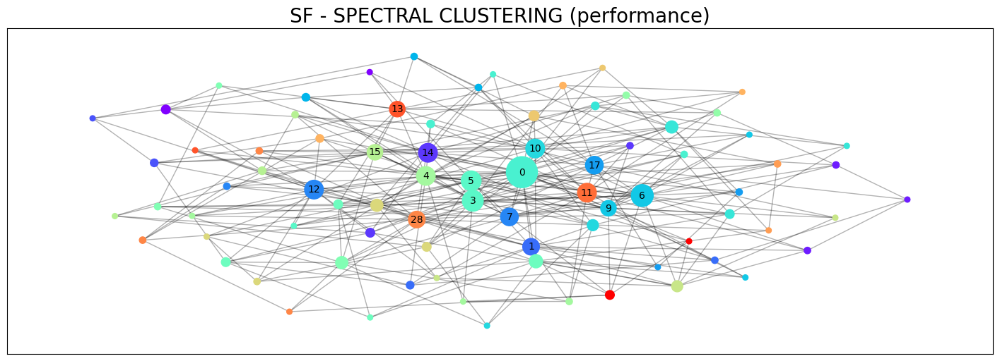

--- 0.015949726104736328 seconds ---
Communities:  7 , Modularity :  0.26313084314404434 , Performance :  0.8465189873417721


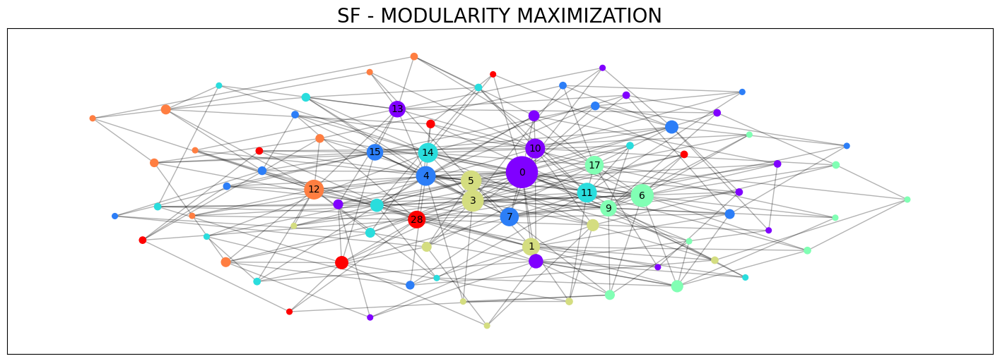

In [316]:
# NEWMAN-GIRVAN 
draw_newman_girvan("SF - NEWMAN-GIRVAN (modularity)", SF, nx.algorithms.community.modularity, 2.5, 1.8)
draw_newman_girvan("SF - NEWMAN-GIRVAN (performance)", SF, nx.algorithms.community.partition_quality, 2.5, 1.8)
# SPECTRAL CLUSTERING 
draw_spectral_clustering("SF - SPECTRAL CLUSTERING (modularity)", SF, nx.algorithms.community.modularity, 2.5, 1.8)
draw_spectral_clustering("SF - SPECTRAL CLUSTERING (performance)", SF, nx.algorithms.community.partition_quality, 2.5, 1.8)
# MODULARITY MAXIMIZATION
draw_modularity_maximization("SF - MODULARITY MAXIMIZATION", SF, 2.5, 1.8)

Παρατηρώντας το χρόνο εκτέλεσης του κάθε αλγορίθμου συμπεραίνουμε ότι ο αλγόριθμος Modularity Maximization είναι ο ταχύτερος εκ των τριών, ενώ ο Girvan-Newman είναι κατά πολύ αργότερος, ειδικά σε μεγάλους γράφους όπως στον EU. Ο Girvan-Newman επιδιώκει βελτιστοποίηση του modularity με αποτέλεσμα να παράγει περισσότερες κοινότητες, ενώ επίσης παρουσιάζει υψηλότερεο score τόσο από τον Spectral Clustering όσο και από τον Modularity Maximization, ο οποίος ωστόσο τον προσεγγίζει αρκετά καλά. Συνολικά θα επιλέγαμε τον αλγόριθμο Modularity Maximization για εξασφάλιση ταχύτητας ή σε περιπτώσεις που χειριζόμαστε μεγάλους γράφους. Σε κάποιες περιπτώσεις όπως εδώ στον EU ενδέχεται ο Spectral Clustering να έχει καλύτερη απόδοση και να υπερτερεί συνολικά του Modularity Maximization, παρά το γεγονός ότι προσφέρει μικρότερες ταχύτητες.


Ο υψηλότερος βαθμός modularity παρατηρείται στον REG γράφο λόγω της ομοιογένειας του. Στη συνέχεια ακολοθούν οι γράφοι RGG και SW, οι οποίοι περιλαμβάνουν κεντρικούς κόμβους που συνδέονται με αρκετούς γείτονες. Έτσι αυξάνονται οι ομάδες που δημιουργούνται και άρα και η μετρική ομαδοποίησης. Έπειτα ο SF έχει και εκείνος κάποιους λιγότερους κεντρικούς κόμβους που σχηματίζουν κάποιες κοινότητες και ανεβάζει λίγο την τιμή του modularity, η οποία παραμένει ωστόσο και πάλι πολύ χαμηλότερη από αυτές των REG,RGG,SW. Τέλος η χαμηλότερη τιμή παρατηρείται στον RGER και οφείλεται στον τυχαίο χαρακτήρα της τοπολογίας.